# **NYC Taxi Duration Dataset Predictions**
*Alan Wu, Allan Zhang, Cameron Shaw*

Context: NYC taxi rides have varying duration times. These ride durations could be explained by a multitude of factors that are either given to us, or computed through pulling outsider data. Our goal in this project is to develop a few models to predict the trip duration of any given taxi ride. We specifically are interested in seeing if there are significant gains in performance from just using included features, with more focus on model fine tuning, or utilizing feature engineering to leverage relationships that we may not have seen before. For the sake of simplicity, we will be narrowing down the dataset to only trips that have pickup and dropoff locations in Manhattan.

Dataset: https://www.kaggle.com/competitions/nyc-taxi-trip-duration/data

We will follow the following methodology to complete our analysis:

1. Data Veracity inspection (null values, values that just don't make sense)
1. Data Preprocessing (initial processing of some outlying variables and addition of some new ones)
1. EDA (investigating the distributions and relationships of features)
1. Feature Engineering (add new features that may be helpful after EDA)
1. Preprocessing (remove any outliers and make sure all types that we want to model are going to be used for modeling, scaling)
1. Baseline model (Linear Regression)
1. Random Forest Model
1. XGBoost Model
1. Conclusion

# Loading Spark and Starting Spark Session

In [2]:
from pyspark.sql import SparkSession
import pyspark.pandas as ps

spark = SparkSession.builder \
		.config("spark.driver.memory", "4g") \
		.config("spark.executor.memory", "4g") \
		.getOrCreate()

/Users/alanwu/Documents/GitHub/NYC-Taxi-Duration-Prediction/venv/lib/python3.11/site-packages/pyspark/pandas/__init__.py:50: UserWarning: 'PYARROW_IGNORE_TIMEZONE' environment variable was not set. It is required to set this environment variable to '1' in both driver and executor sides if you use pyarrow>=2.0.0. pandas-on-Spark will set it for you but it does not work if there is a Spark context already launched.
  warnings.warn(
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/12/28 19:26:28 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [3]:
spark

# Part 1: Loading the Initial Dataset + Sanity Checks

Imports

In [4]:
import geopy.distance as gp
import duckdb
import folium
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pyspark.sql.functions import col, sum, when

In [5]:
data_path = "./data/train.csv"
taxi_df = spark.read.csv(data_path, header=True)
taxi_df.show()

+---------+---------+-------------------+-------------------+---------------+-------------------+------------------+-------------------+------------------+------------------+-------------+
|       id|vendor_id|    pickup_datetime|   dropoff_datetime|passenger_count|   pickup_longitude|   pickup_latitude|  dropoff_longitude|  dropoff_latitude|store_and_fwd_flag|trip_duration|
+---------+---------+-------------------+-------------------+---------------+-------------------+------------------+-------------------+------------------+------------------+-------------+
|id2875421|        2|2016-03-14 17:24:55|2016-03-14 17:32:30|              1|-73.982154846191406|40.767936706542969|-73.964630126953125|40.765602111816406|                 N|          455|
|id2377394|        1|2016-06-12 00:43:35|2016-06-12 00:54:38|              1|-73.980415344238281|40.738563537597656|-73.999481201171875|40.731151580810547|                 N|          663|
|id3858529|        2|2016-01-19 11:35:24|2016-01-19 12:

In [19]:
print(taxi_df.columns)

['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime', 'passenger_count', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag', 'trip_duration']


### Check for nulls

In [20]:
from pyspark.sql.functions import col, sum, when
null_counts = taxi_df.select(
    [
        sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
        for c in taxi_df.columns
    ]
)
null_counts.show()


+---+---------+---------------+----------------+---------------+----------------+---------------+-----------------+----------------+------------------+-------------+
| id|vendor_id|pickup_datetime|dropoff_datetime|passenger_count|pickup_longitude|pickup_latitude|dropoff_longitude|dropoff_latitude|store_and_fwd_flag|trip_duration|
+---+---------+---------------+----------------+---------------+----------------+---------------+-----------------+----------------+------------------+-------------+
|  0|        0|              0|               0|              0|               0|              0|                0|               0|                 0|            0|
+---+---------+---------------+----------------+---------------+----------------+---------------+-----------------+----------------+------------------+-------------+



No null values

### Sanity check

Since in our training dataset we have both pickup and dropoff datetime, then the trip_duration variable should be indeed the dropoff_datetime - pickup_datetime. We want to check if this is indeed true, and want to remove any rows for which this does not match up with.

In [23]:
from pyspark.sql.functions import col, to_timestamp, unix_timestamp, abs

taxi_df = taxi_df.withColumn('pickup_datetime',to_timestamp(col('pickup_datetime'))) \
		.withColumn('dropoff_datetime',to_timestamp(col('dropoff_datetime')))
taxi_df = taxi_df.withColumn('calculated_duration', abs(unix_timestamp('dropoff_datetime') - unix_timestamp('pickup_datetime')))
mismatched_rows = taxi_df.filter(col("trip_duration") != col("calculated_duration"))
mismatched_count = mismatched_rows.count()

print(f"We have {mismatched_count} mismatched rows")

We have 0 mismatched rows


# Part 2: Data Preprocessing



We want to do some initial preprocessing, such as adding external data or separating one variable into different features. We will do further feature engineering as we get closer to the modeling step

### Dates

The current pickup and dropoff datetime objects are string types. We want to make these both datetime objects and break down the datetimes into hour, day, month

In [ ]:
taxi_df['pickup_datetime'] = pd.to_datetime(taxi_df['pickup_datetime'])
taxi_df['date'] = taxi_df['pickup_datetime'].dt.date
taxi_df['hour'] = taxi_df['pickup_datetime'].dt.hour
taxi_df['day'] = taxi_df['pickup_datetime'].dt.weekday
taxi_df['month'] = taxi_df['pickup_datetime'].dt.month
taxi_df

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,date,hour,day,month
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,2016-03-14,17,0,3
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,2016-06-12,0,6,6
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,2016-01-19,11,1,1
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429,2016-04-06,19,2,4
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435,2016-03-26,13,5,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,778,2016-04-08,13,4,4
1458640,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,655,2016-01-10,7,6,1
1458641,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,764,2016-04-22,6,4,4
1458642,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,373,2016-01-05,15,1,1


### Distances

Next, we are interested in computing the distance from the dropoff location to the pickup location. We use the [geopy](https://pypi.org/project/geopy/) distance function to find the haversine distance in miles.

In [ ]:
def distance(start_lat, start_lon, end_lat, end_lon):
  return gp.distance((start_lat, start_lon), (end_lat, end_lon)).miles

try:
  duckdb.remove_function("distance")
except:
  pass

duckdb.create_function("distance", distance, [float, float, float, float], float)

/var/folders/d0/4qvvbdzj6lg3k7zh204kqmk80000gn/T/ipykernel_24905/3185397871.py:9: DeprecationWarning: numpy.core is deprecated and has been renamed to numpy._core. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.multiarray.
  duckdb.create_function("distance", distance, [float, float, float, float], float)


In [ ]:
query = """
SELECT *, distance(pickup_latitude, pickup_longitude, dropoff_latitude, dropoff_longitude) AS distance
FROM taxi_df
"""
taxi_df = duckdb.sql(query).df()

### Weather

We want to include the weather during the trip as a consideration. It's a common notion that poor weather leads to traffic and road closures, which can contribute to increased trip durations. We will use the [Open Meteo](https://open-meteo.com/) API to retrieve daily weather data in the first half of 2016 since that is the range of dates our dataset has trip data on. The coordinates we will use are for the Manhattan financial district, which we will assume to have similar weather to the rest of New York City. We chose to retrieve the temperature at 2m above sea level min, max, and mean to try to account for days with a large range of temperatures. Additionally, we will also retrieve the sunrise, sunset, rain, snow, and wind speed values, as we believe these could all potentially play a role in trip duration.

In [ ]:
# https://archive-api.open-meteo.com/v1/archive?latitude=40.7143&longitude=-74.006&start_date=2016-01-01&end_date=2016-06-30&daily=temperature_2m_max,temperature_2m_min,temperature_2m_mean,sunrise,sunset,rain_sum,snowfall_sum&timezone=America%2FNew_York
weather_df = pd.read_csv('drive/MyDrive/CIS 5450 Final Project/nyc_weather.csv', header=2)
weather_df

,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),sunrise (iso8601),sunset (iso8601),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h)
0,2016-01-01,6.0,0.1,3.0,2016-01-01T07:20,2016-01-01T16:38,0.0,0.0,21.1
1,2016-01-02,4.1,-1.6,0.9,2016-01-02T07:20,2016-01-02T16:39,0.0,0.0,15.2
2,2016-01-03,6.4,-1.1,1.8,2016-01-03T07:20,2016-01-03T16:40,0.0,0.0,19.1
3,2016-01-04,-0.6,-8.5,-2.9,2016-01-04T07:20,2016-01-04T16:41,0.0,0.0,26.3
4,2016-01-05,-1.6,-10.2,-6.0,2016-01-05T07:20,2016-01-05T16:42,0.0,0.0,24.4
...,...,...,...,...,...,...,...,...,...
177,2016-06-26,29.3,17.7,22.9,2016-06-26T04:26,2016-06-26T19:31,0.0,0.0,17.7
178,2016-06-27,27.9,16.7,22.5,2016-06-27T04:27,2016-06-27T19:31,5.9,0.0,18.9
179,2016-06-28,23.5,20.2,21.5,2016-06-28T04:27,2016-06-28T19:31,10.5,0.0,14.1
180,2016-06-29,27.8,20.0,23.4,2016-06-29T04:28,2016-06-29T19:31,1.4,0.0,11.4


We first convert the dates in the `time` column to datetime objects then perform a join on `taxi_df.date` and `weather_df.time`.

In [ ]:
weather_df['time'] = pd.to_datetime(weather_df['time'])

In [ ]:
taxi_df = pd.merge(taxi_df, weather_df, left_on='date', right_on='time')
taxi_df

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,distance,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),sunrise (iso8601),sunset (iso8601),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h)
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,0.933406,2016-03-14,8.3,5.3,6.4,2016-03-14T06:08,2016-03-14T18:02,4.6,0.0,26.0
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,1.123849,2016-06-12,26.7,15.5,22.8,2016-06-12T04:24,2016-06-12T19:27,0.0,0.0,29.3
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,3.964154,2016-01-19,-2.5,-8.8,-5.8,2016-01-19T07:16,2016-01-19T16:57,0.0,0.0,32.2
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,0.921886,2016-04-06,7.9,-3.5,3.2,2016-04-06T05:30,2016-04-06T18:26,0.0,0.0,25.7
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,0.737591,2016-03-26,10.5,2.3,6.2,2016-03-26T05:48,2016-03-26T18:14,0.0,0.0,18.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,...,0.762478,2016-04-08,9.1,3.0,6.8,2016-04-08T05:27,2016-04-08T18:28,0.3,0.0,26.8
1458640,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,...,3.756942,2016-01-10,13.7,3.3,10.0,2016-01-10T07:19,2016-01-10T16:47,31.2,0.0,28.8
1458641,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,...,4.860075,2016-04-22,24.8,11.6,18.0,2016-04-22T05:05,2016-04-22T18:43,3.4,0.0,10.9
1458642,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,...,0.678863,2016-01-05,-1.6,-10.2,-6.0,2016-01-05T07:20,2016-01-05T16:42,0.0,0.0,24.4


### Neighborhood Data

We also want to include neighborhood data. There is reason to believe that knowing the start and end neightborhood the taxi was in would give us a better understanding of how to account for differences in traffic and road types between different areas of Manhattan. For instance, the Financial District is very dense and busy, whereas Washington Heights in the north of Manhattan might have less traffic and faster roads.

The dataset we used to classify the pickup and dropoff neighborhoods comes from [NYC OpenData](https://data.cityofnewyork.us/City-Government/Community-Districts/yfnk-k7r4). It simply contains a list of coordinates that correspond to the outline of each neighborhood, along with a corresponding "community district code". The first digit of this three digit code is the borough (1 for Manhattan, 2 for The Bronx, 3 for Brooklyn, 4 for Queens, 5 for Staten Island), and the last two digits correspond to the particular neighborhoods in that borough. In addition to loading the neighborhood data, we have also included a dictionary that maps all the Manhattan codes to their names for easier interpretability.


![Map of Neighborhoods in New York City](https://www.nyc.gov/assets/planning/images/content/pages/community/community-portal/flash-map-for-print.png)

[Community Districts Dataset](https://data.cityofnewyork.us/City-Government/Community-Districts/yfnk-k7r4)

[Community Districts Codes Table](https://data.cityofnewyork.us/City-Government/2020-Community-District-Tabulation-Areas-CDTAs-/xn3r-zk6y/about_data)

In [ ]:
import json
from shapely.geometry import shape, Point
from shapely.strtree import STRtree

!wget -O "community_districts.json" https://data.cityofnewyork.us/resource/jp9i-3b7y.json
manhattan_neighborhood_names = {101: "Financial District",
                                102: "Greenwich Village",
                                103: "Lower East Side",
                                104: "Chelsea/Hell's Kitchen",
                                105: "Midtown",
                                106: "East Midtown",
                                107: "Upper West Side",
                                108: "Upper East Side",
                                109: "Morningside Heights",
                                110: "Harlem",
                                111: "East Harlem",
                                112: "Washington Heights",
                                164: "Central Park"}

--2024-12-07 00:30:30--  https://data.cityofnewyork.us/resource/jp9i-3b7y.json
Resolving data.cityofnewyork.us (data.cityofnewyork.us)... 35.170.133.124, 100.28.82.57, 174.129.43.10
Connecting to data.cityofnewyork.us (data.cityofnewyork.us)|35.170.133.124|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/json]
Saving to: ‘community_districts.json’

community_districts     [  <=>               ]   3.68M  9.78MB/s    in 0.4s    

2024-12-07 00:30:31 (9.78 MB/s) - ‘community_districts.json’ saved [3854632]



Using `shapely`, we construct an R-tree spatial index of the neighborhoods to help reduce processing times.

In [ ]:
# Load geometry of each borough into dictionary
cd_names = []
cd_geoms = []
with open('community_districts.json', 'r') as w:
  cds_json = json.loads(w.read())
  for feature in cds_json:
    cd_names.append(feature["boro_cd"])
    cd_geoms.append(shape(feature["the_geom"]))
tree = STRtree(cd_geoms)

In [ ]:
# Returns the borough the specified coordinates are located in and None if not in one
def get_neighborhood(lon, lat):
  p = Point((lon, lat))
  nearest_indices = tree.query(p, predicate="within")
  if len(nearest_indices) == 0:
    return -1
  else:
    return cd_names[nearest_indices[0]]

try:
  duckdb.remove_function("get_neighborhood")
except:
  pass

duckdb.create_function("get_neighborhood", get_neighborhood, [float, float], int)

We can now apply the get_neighborhood function created earlier to our dataset, creating columns for the pickup and dropoff neighborhood of each trip. Since a -1 corresponds to a location outside NYC, we can just remove these from the dataset for our purposes.

In [ ]:
%%time
# Create pickup_neighborhood and dropoff_neighborhood columns by applying get_neighborhood function
query1 = """
SELECT
  *,
  get_neighborhood(pickup_longitude, pickup_latitude) AS pickup_neighborhood,
  get_neighborhood(dropoff_longitude, dropoff_latitude) AS dropoff_neighborhood,
  CASE WHEN pickup_neighborhood != dropoff_neighborhood THEN 1 ELSE 0 END AS inter_neighborhood
FROM taxi_df
"""
# Separating WHERE clause cuts down processing time
query2 = """
SELECT * FROM taxi_df WHERE pickup_neighborhood != -1 AND dropoff_neighborhood != -1;
"""
taxi_df = duckdb.sql(query1).to_df()
taxi_df = duckdb.sql(query2).to_df()
taxi_df

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

CPU times: user 47min 18s, sys: 27.1 s, total: 47min 45s
Wall time: 29min 46s


,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,temperature_2m_min (°C),temperature_2m_mean (°C),sunrise (iso8601),sunset (iso8601),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h),pickup_neighborhood,dropoff_neighborhood,inter_neighborhood
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,5.3,6.4,2016-03-14T06:08,2016-03-14T18:02,4.6,0.0,26.0,104,108,1
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,15.5,22.8,2016-06-12T04:24,2016-06-12T19:27,0.0,0.0,29.3,106,102,1
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,-8.8,-5.8,2016-01-19T07:16,2016-01-19T16:57,0.0,0.0,32.2,105,101,1
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,-3.5,3.2,2016-04-06T05:30,2016-04-06T18:26,0.0,0.0,25.7,101,101,0
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,2.3,6.2,2016-03-26T05:48,2016-03-26T18:14,0.0,0.0,18.9,107,107,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452054,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,...,3.0,6.8,2016-04-08T05:27,2016-04-08T18:28,0.3,0.0,26.8,105,104,1
1452055,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,...,3.3,10.0,2016-01-10T07:19,2016-01-10T16:47,31.2,0.0,28.8,104,107,1
1452056,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,...,11.6,18.0,2016-04-22T05:05,2016-04-22T18:43,3.4,0.0,10.9,108,101,1
1452057,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,...,-10.2,-6.0,2016-01-05T07:20,2016-01-05T16:42,0.0,0.0,24.4,105,105,0


### Narrow down to Manhattan coordinates

We have decided to focus on predicting the duration of trips that start and end in Manhattan to refine our problem, and we do this by filtering out trips that start or end outside Manhattan.

In [ ]:
# Only Manhattan neighborhoods start with 1 for their code
taxi_df = taxi_df[(taxi_df["pickup_neighborhood"].between(100, 199)) &
                          (taxi_df["dropoff_neighborhood"].between(100, 199))].reset_index(drop=True)

### Save final df

Finally, we can save out our pre-processed dataset to a CSV file for use in later parts.

In [ ]:
taxi_df.to_csv('final_taxi_train_df.csv', index=False)
taxi_df

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,temperature_2m_min (°C),temperature_2m_mean (°C),sunrise (iso8601),sunset (iso8601),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h),pickup_neighborhood,dropoff_neighborhood,inter_neighborhood
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,5.3,6.4,2016-03-14T06:08,2016-03-14T18:02,4.6,0.0,26.0,104,108,1
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,15.5,22.8,2016-06-12T04:24,2016-06-12T19:27,0.0,0.0,29.3,106,102,1
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,-8.8,-5.8,2016-01-19T07:16,2016-01-19T16:57,0.0,0.0,32.2,105,101,1
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,-3.5,3.2,2016-04-06T05:30,2016-04-06T18:26,0.0,0.0,25.7,101,101,0
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,2.3,6.2,2016-03-26T05:48,2016-03-26T18:14,0.0,0.0,18.9,107,107,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1232192,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,...,3.0,6.8,2016-04-08T05:27,2016-04-08T18:28,0.3,0.0,26.8,105,104,1
1232193,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,...,3.3,10.0,2016-01-10T07:19,2016-01-10T16:47,31.2,0.0,28.8,104,107,1
1232194,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,...,11.6,18.0,2016-04-22T05:05,2016-04-22T18:43,3.4,0.0,10.9,108,101,1
1232195,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,...,-10.2,-6.0,2016-01-05T07:20,2016-01-05T16:42,0.0,0.0,24.4,105,105,0


# Part 3: EDA

We will use the following list to determine what we perform EDA on:
1. Each individual feature from the original dataset, excluding engineered features
1. Two-feature relationships of the original dataset (either cross feature or feature relationships with the target variable duration) and engineered features

We want to look at the following variables that might be of interest. The inductive bias behind analyzing time of day and day of week for the trips is that they may be correlated with higher or lower durations trip durations.

- the target variable duration
- vendor id
- passenger count
- pickup and dropoff location (longitide and latitude)
- pickup and dropoff time/day
- store_and_fwd flag

### Data loading

In [ ]:
path = 'drive/My Drive/CIS 5450 Final Project/final_taxi_train_df.csv'
path2 = 'drive/My Drive/CIS 5450 Final Project/train.csv'
df = pd.read_csv(path)
original_df = pd.read_csv(path2)

In [ ]:
df.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration,hour,day,month,distance,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h),pickup_neighborhood,dropoff_neighborhood,inter_neighborhood
count,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06,1.232197e+06
mean,1.534087e+00,1.661975e+00,-7.398144e+01,4.075457e+01,-7.398021e+01,4.075621e+01,8.060486e+02,1.373929e+01,3.037185e+00,3.507011e+00,1.460936e+00,1.354163e+01,4.375199e+00,8.906413e+00,1.936985e+00,1.715534e-01,1.823642e+01,1.060687e+02,1.061418e+02,7.076734e-01
std,4.988369e-01,1.314107e+00,1.628060e-02,2.169434e-02,1.751652e-02,2.434738e-02,3.685550e+03,6.184098e+00,1.944128e+00,1.680672e+00,1.118298e+00,9.380799e+00,8.386682e+00,8.636906e+00,4.469617e+00,1.272574e+00,6.683518e+00,7.404850e+00,7.070519e+00,4.548318e-01
min,1.000000e+00,0.000000e+00,-7.401842e+01,4.070077e+01,-7.401851e+01,4.070104e+01,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,-9.700000e+00,-1.890000e+01,-1.390000e+01,0.000000e+00,0.000000e+00,7.100000e+00,1.010000e+02,1.010000e+02,0.000000e+00
25%,1.000000e+00,1.000000e+00,-7.399245e+01,4.074006e+01,-7.399208e+01,4.074033e+01,3.680000e+02,9.000000e+00,1.000000e+00,2.000000e+00,7.118591e-01,5.600000e+00,-1.800000e+00,1.400000e+00,0.000000e+00,0.000000e+00,1.330000e+01,1.040000e+02,1.040000e+02,0.000000e+00
50%,2.000000e+00,1.000000e+00,-7.398237e+01,4.075532e+01,-7.398150e+01,4.075610e+01,5.930000e+02,1.400000e+01,3.000000e+00,4.000000e+00,1.140579e+00,1.330000e+01,4.700000e+00,9.000000e+00,0.000000e+00,0.000000e+00,1.660000e+01,1.050000e+02,1.050000e+02,1.000000e+00
75%,2.000000e+00,2.000000e+00,-7.397081e+01,4.076842e+01,-7.396902e+01,4.077095e+01,9.100000e+02,1.900000e+01,5.000000e+00,5.000000e+00,1.852240e+00,2.110000e+01,1.020000e+01,1.490000e+01,1.800000e+00,0.000000e+00,2.230000e+01,1.070000e+02,1.070000e+02,1.000000e+00
max,2.000000e+00,6.000000e+00,-7.391260e+01,4.087246e+01,-7.391113e+01,4.087334e+01,2.227612e+06,2.300000e+01,6.000000e+00,6.000000e+00,1.264647e+01,3.090000e+01,2.070000e+01,2.540000e+01,3.120000e+01,3.080000e+01,4.130000e+01,1.640000e+02,1.640000e+02,1.000000e+00


In [ ]:
numerical_variables = original_df.select_dtypes(include=['float64', 'int64']).columns
categorical_variables = original_df.select_dtypes(include=['object']).columns

print("There are {} numerical and {} categorical variables in the base dataset".format(len(numerical_variables), len(categorical_variables)))
print('Numerical Variables:', numerical_variables)
print('Categorical Variables:', categorical_variables)

There are 7 numerical and 4 categorical variables in the base dataset
Numerical Variables: Index(['vendor_id', 'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'trip_duration'],
      dtype='object')
Categorical Variables: Index(['id', 'pickup_datetime', 'dropoff_datetime', 'store_and_fwd_flag'], dtype='object')


## Singular Variables

### Trip Duration

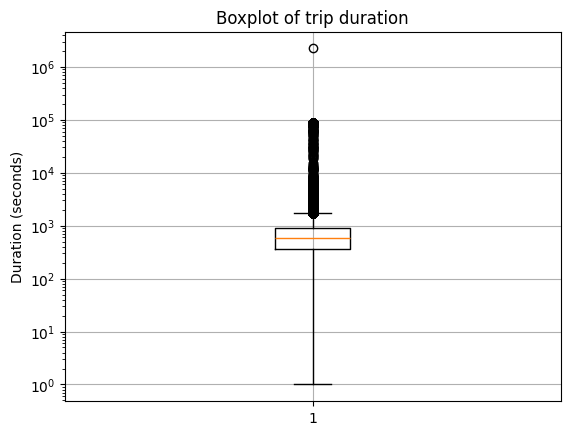

In [ ]:
plt.boxplot(df['trip_duration'])
plt.title('Boxplot of trip duration')
plt.ylabel('Duration (seconds)')
plt.yscale('log')
plt.grid()
plt.show()

Based on the boxplot of trip duration we see significant outliers. So, we will remove values below the 0.5th percentile and above the 99.5th percentile.

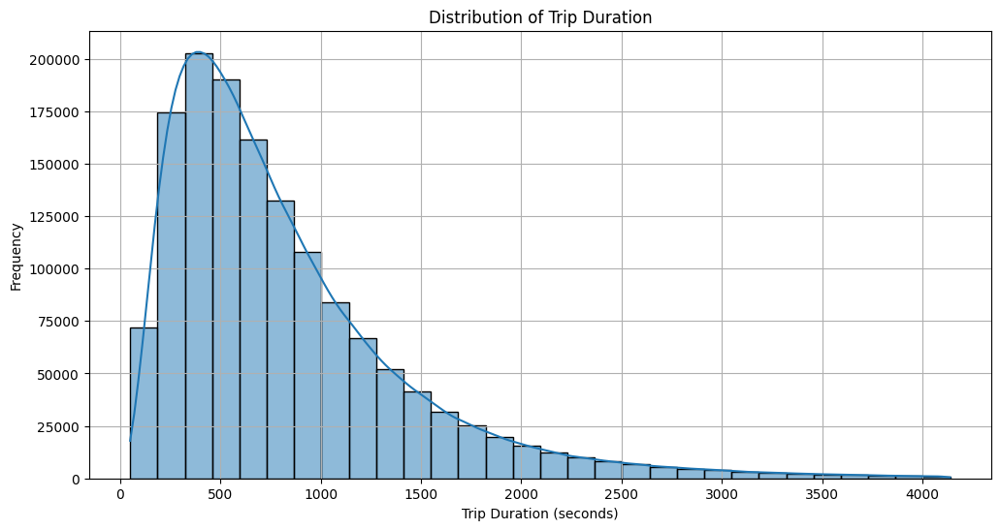

In [ ]:
dur_threshold = original_df['trip_duration'].quantile(0.995)
dur_threshold_low = original_df['trip_duration'].quantile(0.005)

plt.figure(figsize=(12, 6))
sns.histplot(original_df['trip_duration'][(original_df['trip_duration'] <= dur_threshold) & (original_df['trip_duration'] >= dur_threshold_low)], bins=30, kde=True)
plt.title('Distribution of Trip Duration')
plt.grid()
plt.xlabel('Trip Duration (seconds)')
plt.ylabel('Frequency')
plt.show()

The durations within the 0.5th to 99.5th percentile (which would exclude outliers) still has a right skew distribution. More trips have shorter durations than longer durations There is also heavy skew on the original data as well. We definitely want to take this into consideration when scaling our features

### Vendor ID
The vendor ID corresponds to the manufacturer of the taxi computer. There are only 2 manufacturers.

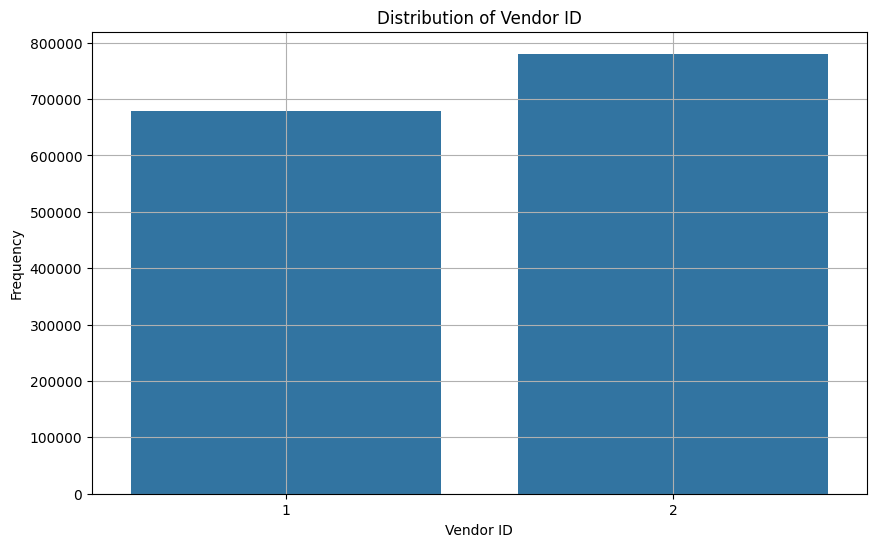

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x= original_df['vendor_id'].value_counts().index, y= original_df['vendor_id'].value_counts().values)
plt.title('Distribution of Vendor ID')
plt.grid()
plt.xlabel('Vendor ID')
plt.ylabel('Frequency')
plt.show()

There are relatively similar numbers of trips from each manufacturer, so we most likely do not need to adjust for differences between the distributions of the trip durations across vendors.




### Passenger Count
The number of passengers in the vehicle according to the driver. Because this is human-entered, we would expect the feature to be somewhat unreliable.

In [ ]:
original_df['passenger_count'].value_counts()

passenger_count
1    1033540
2     210318
5      78088
3      59896
6      48333
4      28404
0         60
7          3
9          1
8          1
Name: count, dtype: int64

It is interesting that there are logged trips with 0 passengers, this may be something we want to address in preprocessing. Furthermore, we notice that most of our trips have only one passenger, which may indicate that this could be unreliable as a predictive feature.

### Pickup and Dropoff Locations
The latitude and longitude of the pickup point and dropoff point of the taxi ride. THe folium map includes trips with pickup/dropoff locations outside Manhattan, but for modeling we will remove these.

Pickup

In [ ]:
long_lat_subset = original_df[['pickup_longitude', 'pickup_latitude']].sample(5000)
map_nyc = folium.Map(location=[40.767937, -73.982155], zoom_start=12)
for idx, row in long_lat_subset.iterrows():
    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=2,
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(map_nyc)
map_nyc


Dropoff

In [ ]:
long_lat_subset = original_df[['dropoff_longitude', 'dropoff_latitude']].sample(5000)
map_nyc = folium.Map(location=[40.767937, -73.982155], zoom_start=12)
for idx, row in long_lat_subset.iterrows():
    folium.CircleMarker(
        location=[row['dropoff_latitude'], row['dropoff_longitude']],
        radius=2,
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(map_nyc)
map_nyc

We notice that there are some trips in Queens and to Newark International Airport. However, since we are only worried about the trips in Manhattan, we observe a large centralization within the midtown and downtown area. As we go more uptown, there are fewer trips.

### Time of Day and Day of Week
Time of day is the hour the trip started (0: 12:00am-12:59am, 1: 1:00am-1:59am, etc.), and day of week is a number from 0 to 6 starting with Monday.

Day Of Week

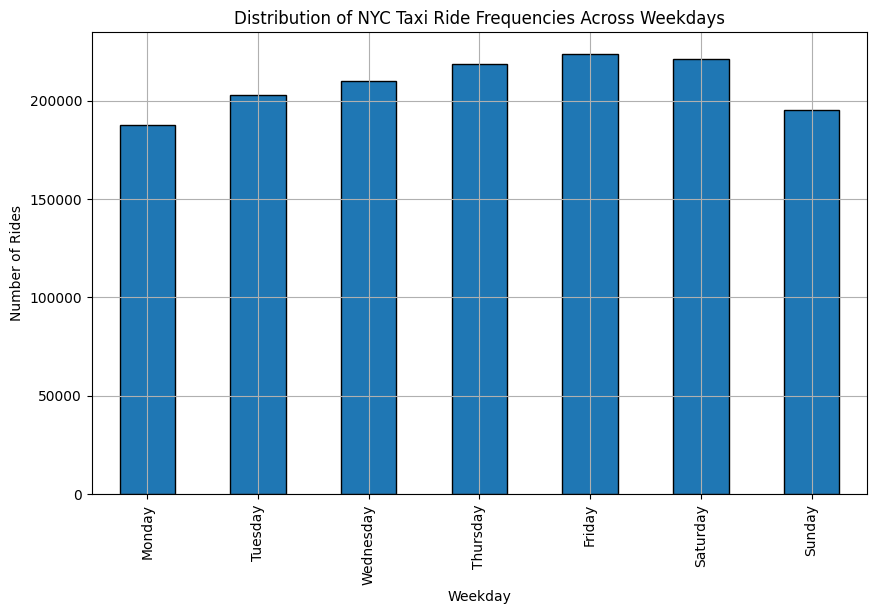

In [ ]:
original_df['pickup_datetime'] = pd.to_datetime(original_df['pickup_datetime'])
original_df['dropoff_datetime'] = pd.to_datetime(original_df['dropoff_datetime'])
weekdays = original_df['pickup_datetime'].dt.day_name()
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_counts = weekdays.value_counts().reindex(ordered_days)

plt.figure(figsize=(10,6))
weekday_counts.plot(kind='bar', edgecolor='black')
plt.title("Distribution of NYC Taxi Ride Frequencies Across Weekdays")
plt.grid()
plt.xlabel("Weekday")
plt.ylabel("Number of Rides")
plt.show()

Time of Day

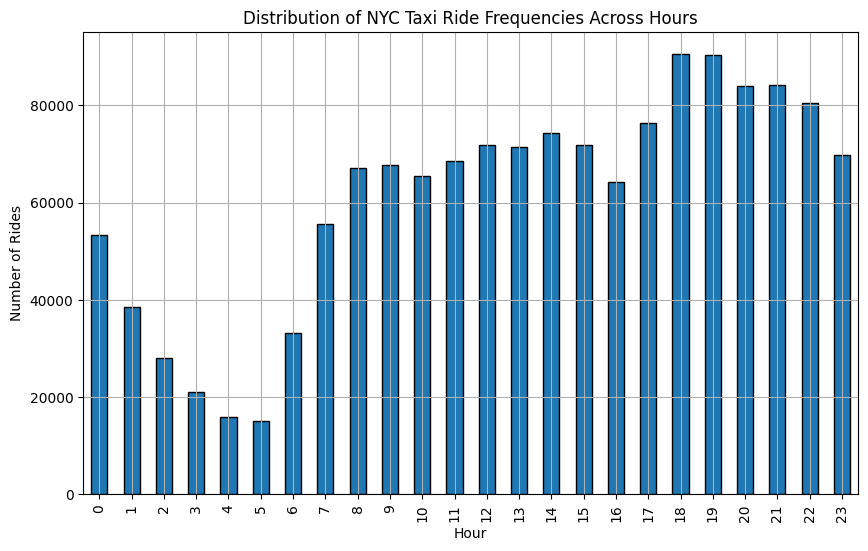

In [ ]:
hours = original_df['pickup_datetime'].dt.hour
hours_counts = hours.value_counts().sort_index()
plt.figure(figsize=(10,6))
hours_counts.plot(kind='bar', edgecolor='black')
plt.title("Distribution of NYC Taxi Ride Frequencies Across Hours")
plt.grid()
plt.xlabel("Hour")
plt.ylabel("Number of Rides")
plt.show()

<ipython-input-8-92ddf613971e>:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  hourly_counts = hour_wd.groupby(['hour', 'weekday']).size().reset_index(name='counts')


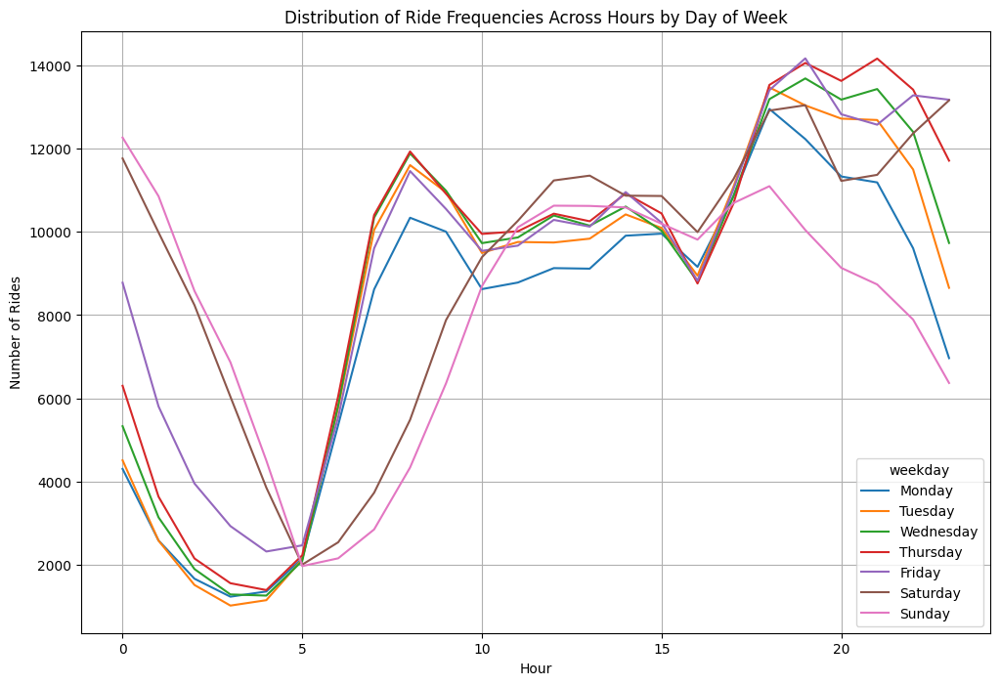

In [ ]:
weekday  = original_df['pickup_datetime'].dt.day_name()

hour_wd = pd.DataFrame({'weekday': weekday, 'hour': hours})
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

hour_wd['weekday'] = pd.Categorical(hour_wd['weekday'], categories=weekday_order, ordered=True)

hourly_counts = hour_wd.groupby(['hour', 'weekday']).size().reset_index(name='counts')



plt.figure(figsize=(12,8))
sns.lineplot(data=hourly_counts, x='hour', y='counts', hue='weekday', palette='tab10')
plt.title("Distribution of Ride Frequencies Across Hours by Day of Week")
plt.grid()
plt.xlabel("Hour")
plt.ylabel("Number of Rides")
plt.show()

We notice that generally the rides are more frequent at rush hours and at night, and are quite sparse in the early morning. There also seem to be more rides toward the end of the week, peaking on Friday. We also observe that there tend to be more trips in the early morning on the weekends, and fewer trips for the rest of the morning.

### Store and Forward flag
This feature is "yes" if the vehicle had a connection to the remote server, and "no" if the trip was stored and forwarded later.

In [ ]:
original_df['store_and_fwd_flag'].value_counts()

,count
store_and_fwd_flag,
N,1450599
Y,8045


This feature is disproportionately "no". We want to consider using this feature later on, since it could correspond to longer or shorter trips when it is "yes".

### Distance

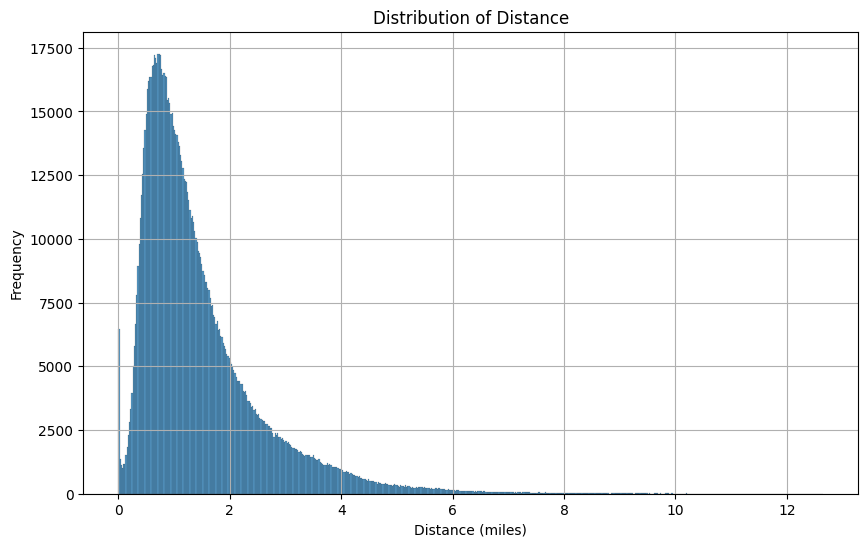

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['distance'])
plt.title('Distribution of Distance')
plt.grid()
plt.xlabel('Distance (miles)')
plt.ylabel('Frequency')
plt.show()

As expected, the distance is skewed to the right as well. Since we have many trips that are short and not a lot that are long, then it would make sense that there are a lot of trips thta are short as compared to long trips. This may make us want to consider something like a RobustScaler to scale our variables instead of typical standard scaler

## Relationships with Duration

For this section, we want to explore the relationships of certain variables that we think might influence the trip duration. And thus, we will use the post-processed dataset to explore these relationships. Just based on our inductive bias, we think the following might influence the trip duration:
1. distance (engineered from the pickup location and the dropoff location)
1. the day of week
1. the time of day
1. temperature (pulled from a weather dataset)

### Mean duration by distance

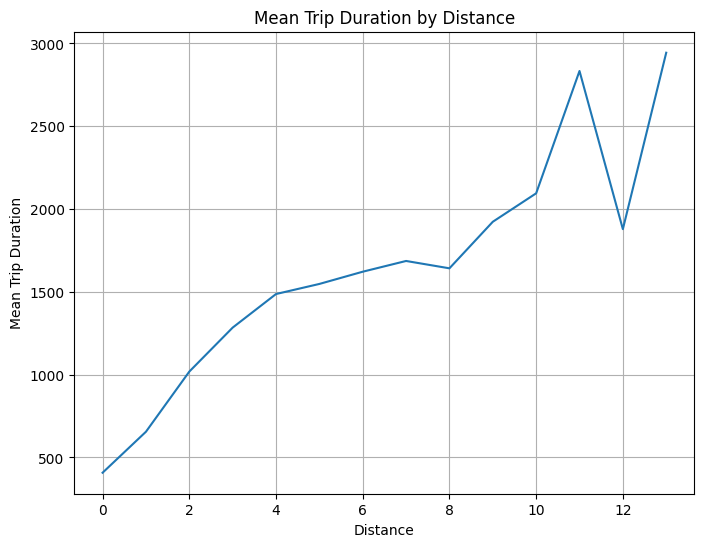

In [ ]:
df['distance'] = df['distance'].round(0)
mean_duration_by_dist = df.groupby('distance')['trip_duration'].mean().reset_index()
plt.figure(figsize=(8, 6))
sns.lineplot(
    x='distance',
    y='trip_duration',
    data=mean_duration_by_dist,
)

plt.title('Mean Trip Duration by Distance')
plt.xlabel('Distance')
plt.grid()
plt.ylabel('Mean Trip Duration')
plt.show()

As expected, the trip duration increases almost linearly with distance. We expect distance to be a powerful predictor in our models.

### Mean duration by date/time

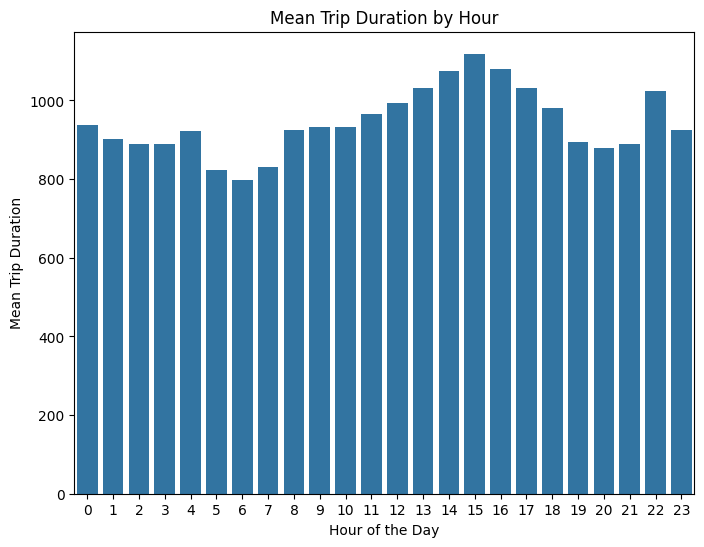

In [ ]:
mean_duration_by_hour = df.groupby('hour')['trip_duration'].mean().reset_index()
plt.figure(figsize=(8, 6))
sns.barplot(x='hour', y='trip_duration', data=mean_duration_by_hour)
plt.title('Mean Trip Duration by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Mean Trip Duration')
plt.show()

We note that trip duration varies quite a bit throughout the day. This could be due to traffic and work patterns, and we would expect hour to be a powerful predictor as well.

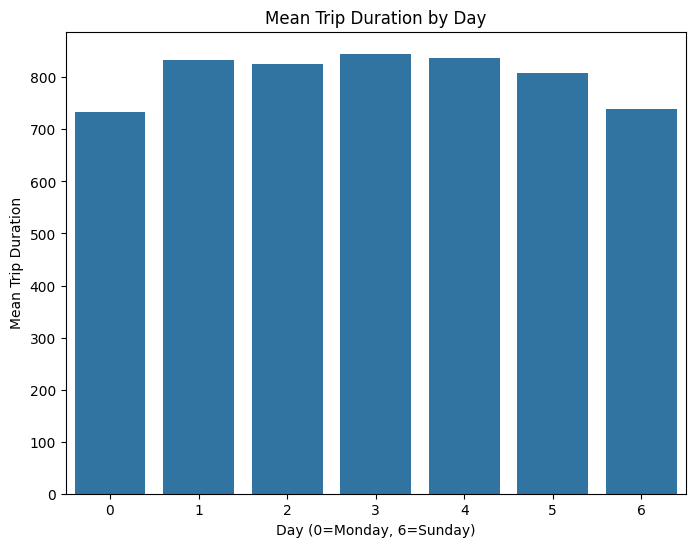

In [ ]:
mean_duration_by_day = df.groupby('day')['trip_duration'].mean().reset_index()
plt.figure(figsize=(8, 6))
sns.barplot(x='day', y='trip_duration', data=mean_duration_by_day)
plt.title('Mean Trip Duration by Day')
plt.xlabel('Day (0=Monday, 6=Sunday)')
plt.ylabel('Mean Trip Duration')
plt.show()

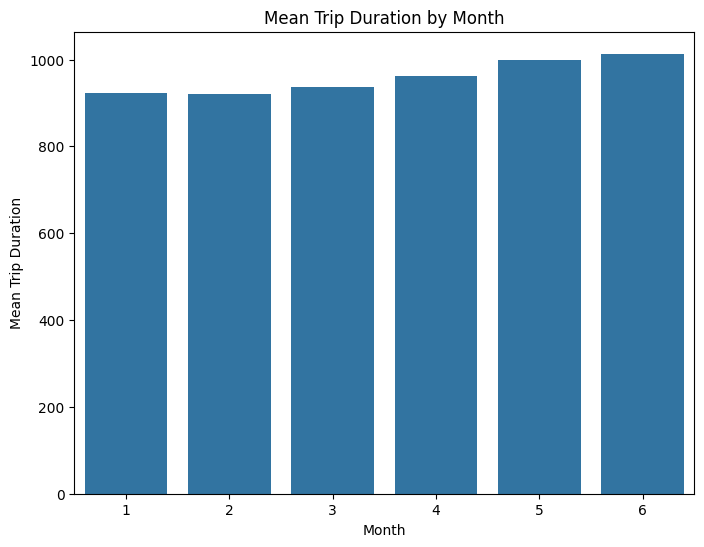

In [ ]:
mean_duration_by_month = df.groupby('month')['trip_duration'].mean().reset_index()
plt.figure(figsize=(8, 6))
sns.barplot(x='month', y='trip_duration', data=mean_duration_by_month)
plt.title('Mean Trip Duration by Month')
plt.xlabel('Month')
plt.ylabel('Mean Trip Duration')
plt.show()

There does not seem to be much variation of mean trip duration based on the month of year, which is expected.

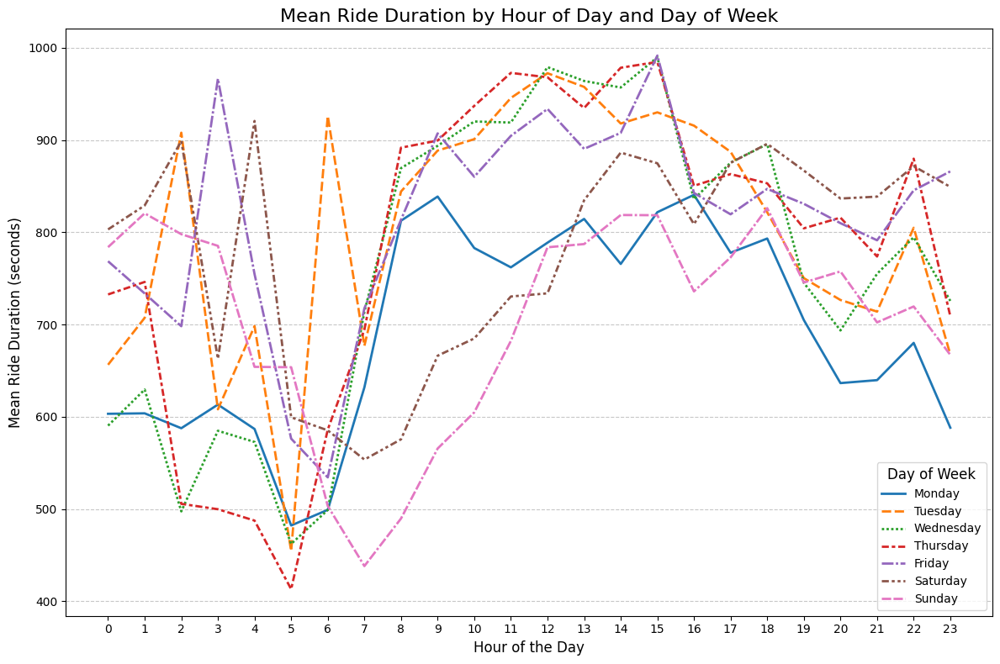

In [ ]:
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])
df['day_of_week'] = df['pickup_datetime'].dt.day_name()
df['hour_of_day'] = df['pickup_datetime'].dt.hour
mean_duration = df.groupby(['day_of_week', 'hour_of_day'])['trip_duration'].mean().reset_index()


mean_duration['day_of_week'] = pd.Categorical(
    mean_duration['day_of_week'],
    categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    ordered=True
)

plot_data = mean_duration.pivot(index='hour_of_day', columns='day_of_week', values='trip_duration')

plt.figure(figsize=(12, 8))
sns.lineplot(data=plot_data, palette="tab10", linewidth=2)
plt.title('Mean Ride Duration by Hour of Day and Day of Week', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=12)
plt.ylabel('Mean Ride Duration (seconds)', fontsize=12)
plt.xticks(range(0, 24), fontsize=10)  # Show all 24 hours
plt.legend(title='Day of Week', fontsize=10, title_fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

It is evident that there is a general trend where the mean duration increases during the rush hour times, which makes sense. On saturday, there also seems to be a peak around 10pm, but this could be due to unfiltered outliers.

Overall, we see that out of all the time scale factors, the hour of the day seems to provide the greatest relationship visually with our outcome trip duration.


### Weather factors

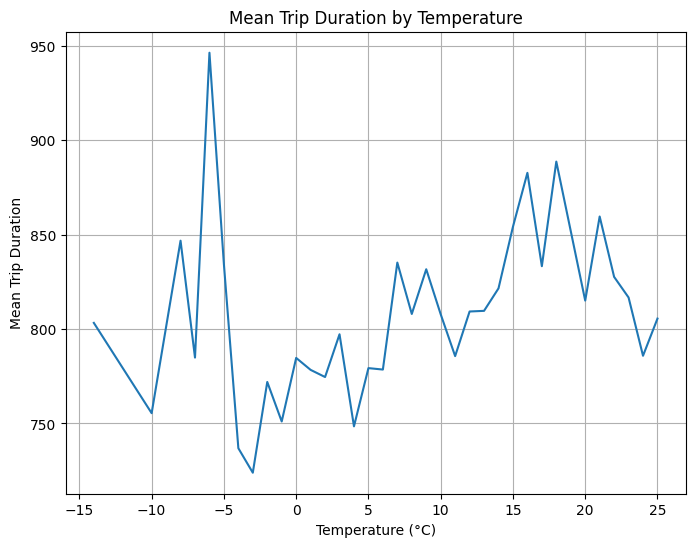

In [ ]:
df['temperature_2m_mean (°C)'] = df['temperature_2m_mean (°C)'].round(0)
mean_duration_by_temp = df.groupby('temperature_2m_mean (°C)')['trip_duration'].mean().reset_index()
plt.figure(figsize=(8, 6))
sns.lineplot(
    x='temperature_2m_mean (°C)',
    y='trip_duration',
    data=mean_duration_by_temp,
)

plt.title('Mean Trip Duration by Temperature')
plt.xlabel('Temperature (°C)')
plt.grid()
plt.ylabel('Mean Trip Duration')
plt.show()

### Neighborhood

In [ ]:
manhattan_neighborhood_names = {101: "Financial District",
                                102: "Greenwich Village",
                                103: "Lower East Side",
                                104: "Chelsea/Hell's Kitchen",
                                105: "Midtown",
                                106: "East Midtown",
                                107: "Upper West Side",
                                108: "Upper East Side",
                                109: "Morningside Heights",
                                110: "Harlem",
                                111: "East Harlem",
                                112: "Washington Heights",
                                164: "Central Park"}

df['pickup_neighborhood'] = df['pickup_neighborhood'].map(manhattan_neighborhood_names)
df['dropoff_neighborhood'] = df['dropoff_neighborhood'].map(manhattan_neighborhood_names)


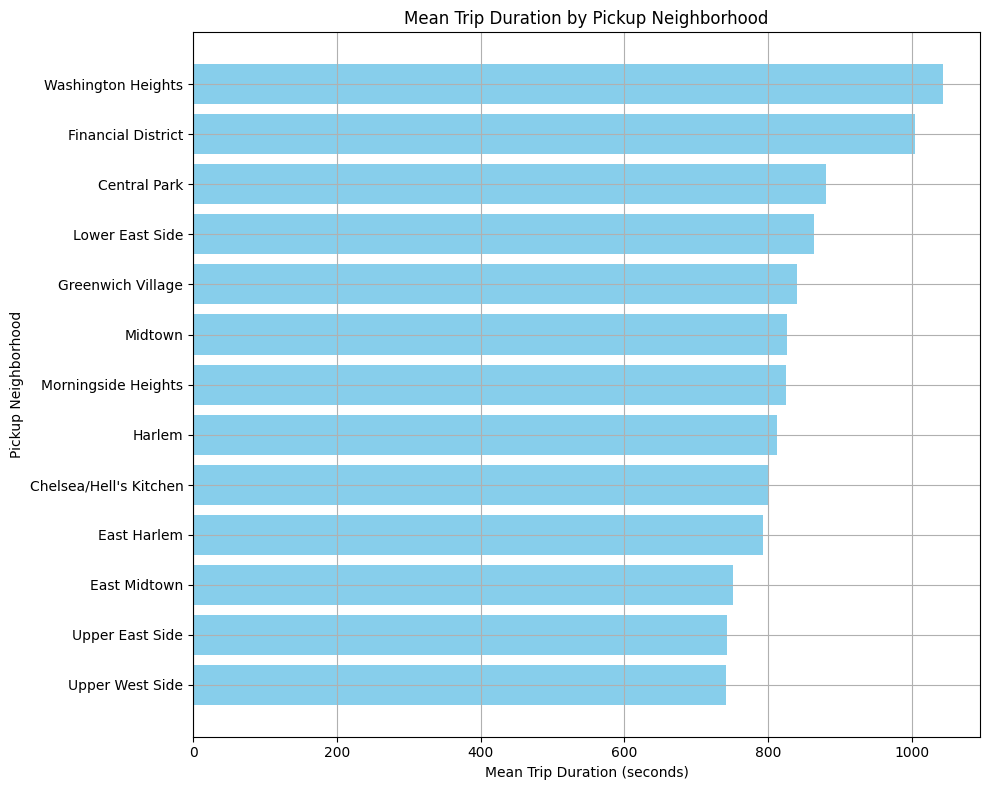

In [ ]:

mean_duration = df.groupby('pickup_neighborhood')['trip_duration'].mean().reset_index()
mean_duration = mean_duration.sort_values(by='trip_duration', ascending=False)


plt.figure(figsize=(10, 8))
plt.barh(mean_duration['pickup_neighborhood'], mean_duration['trip_duration'], color='skyblue')
plt.title('Mean Trip Duration by Pickup Neighborhood')
plt.xlabel('Mean Trip Duration (seconds)')
plt.ylabel('Pickup Neighborhood')
plt.tight_layout()
plt.grid()
plt.gca().invert_yaxis()
plt.show()

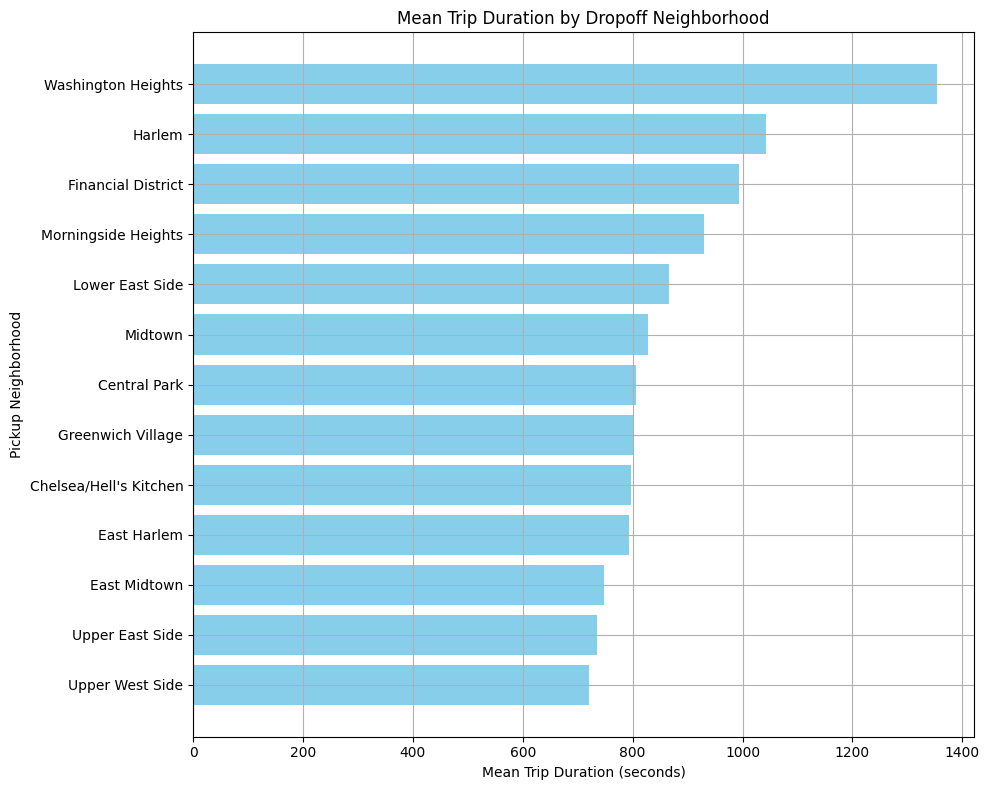

In [ ]:
mean_duration = df.groupby('dropoff_neighborhood')['trip_duration'].mean().reset_index()
mean_duration = mean_duration.sort_values(by='trip_duration', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(mean_duration['dropoff_neighborhood'], mean_duration['trip_duration'], color='skyblue')
plt.title('Mean Trip Duration by Dropoff Neighborhood')
plt.xlabel('Mean Trip Duration (seconds)')
plt.ylabel('Pickup Neighborhood')
plt.tight_layout()
plt.grid()
plt.gca().invert_yaxis()
plt.show()

Inter-Neighborhood

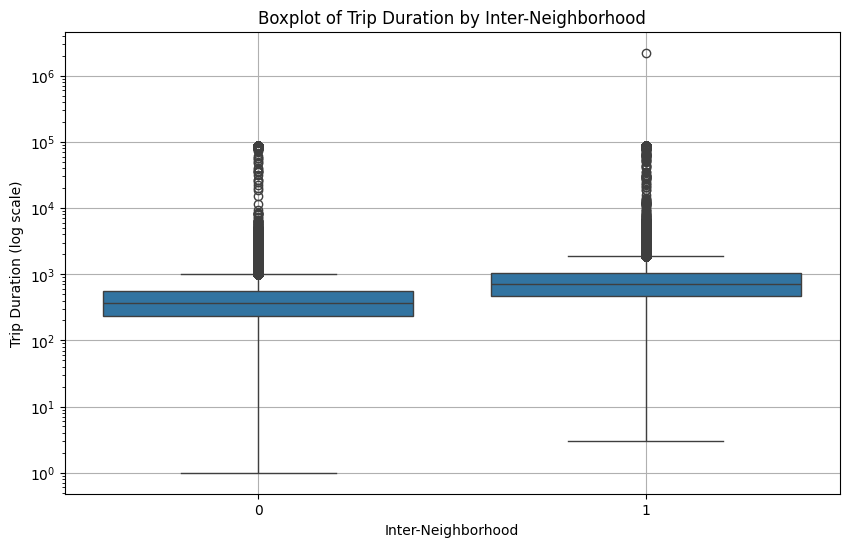

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df,x='inter_neighborhood', y='trip_duration')
plt.title("Boxplot of Trip Duration by Inter-Neighborhood")
plt.xlabel("Inter-Neighborhood")
plt.grid()
plt.yscale('log')
plt.ylabel("Trip Duration (log scale)")
plt.show()

We can see that some neighborhoods exhibit greater mean duration time, for example Financial District people getting picked up from there could be majority leaving work. Besides Washington Heights and Financial District, the other neighborhoods have relatively equally distributed mean duration times

Interesting that there is a different set of dropoff neighborhoods compared to the pickup neighborhoods

After we y-scale the inter-neighborhood flag, we see that inter neighborhood trips tend to have a greater mean than the trips that are between neighborhoods. As expected however, both distributions are highly right skewed as we saw originally.

### Store and FWD Flag

In [ ]:
store_yes = df[df['store_and_fwd_flag'] == 'Y']
store_no = df[df['store_and_fwd_flag'] == 'N']

print("Distribution of the store yes flag: ")
print(store_yes['trip_duration'].describe())
print("Distribution of the store no flag: ")
print(store_no['trip_duration'].describe())


Distribution of the store yes flag: 
count    5631.000000
mean      726.908897
std       491.111981
min         2.000000
25%       381.000000
50%       617.000000
75%       957.000000
max      7824.000000
Name: trip_duration, dtype: float64
Distribution of the store no flag: 
count    1.226566e+06
mean     8.064119e+02
std      3.693847e+03
min      1.000000e+00
25%      3.680000e+02
50%      5.930000e+02
75%      9.100000e+02
max      2.227612e+06
Name: trip_duration, dtype: float64


We notice that the means are quite different and want to run a hypothesis test to see if this difference is significant. We set our $\alpha=0.05$ and simulate the null world 10,000 times. Due to the size of our dataset, we sample 7.5% of the data to avoid memory issues.

In [ ]:
import numpy as np

sampled = df.sample(frac=0.075, random_state=42).reset_index(drop=True)

yes = sampled.loc[sampled["store_and_fwd_flag"] == 'Y']
no = sampled.loc[sampled["store_and_fwd_flag"] == 'N']

test_stat = yes["trip_duration"].mean() - no["trip_duration"].mean()

null_mean = sampled["trip_duration"].mean()
null_std = sampled["trip_duration"].std()

np.random.seed(42)
samples = np.random.normal(null_mean, null_std, (10_000, len(sampled)))
g1 = samples[:,0:len(yes)]
g2 = samples[:,len(yes):]
ts = g1.mean(axis=1) - g2.mean(axis=1)

p_value = (ts < test_stat).sum() / len(ts)
print(f"p-value: {p_value}")

p-value: 0.3067


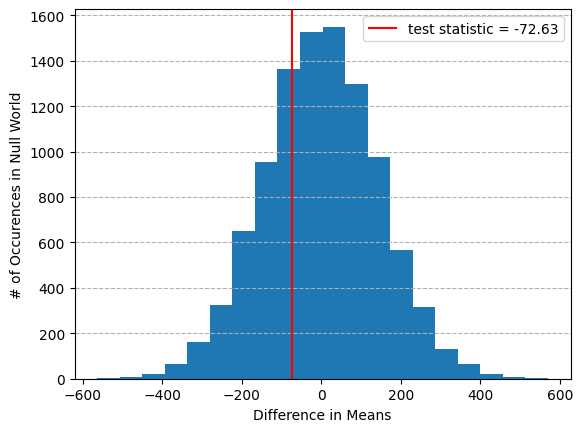

In [ ]:
_ = plt.hist(ts, bins=20)
plt.xlabel("Difference in Means")
plt.ylabel("# of Occurences in Null World")
plt.axvline(test_stat, color='red', label=f"test statistic = {round(test_stat, 2)}")
plt.grid(axis="y", ls="--")
plt.legend()


These means are not significantly different at $\alpha=0.05$. So to reduce model complexity and increase explanability, we will not include this feature in our models.

# Part 4: Feature Engineering

Since we observed in our analysis there could be signficance of predicting the trip duration were the distance and also the time of day/time of week during which the ride occured.

In [ ]:
path = "drive/My Drive/CIS 5450 Final Project/final_taxi_train_df.csv"
data = pd.read_csv(path)

### Manhattan distance

The Manhattan distance may be more accurate than the haversine distance in which we've already computed since the routes that taxi drivers take in a city like NYC are a grid-like movements

In [ ]:
def manhattan_distance(start_lat, start_lon, end_lat, end_lon):
    horizontal = gp.geodesic((start_lat, start_lon), (start_lat, end_lon)).miles
    vertical = gp.geodesic((start_lat, start_lon), (end_lat, start_lon)).miles
    return horizontal + vertical

try:
  duckdb.remove_function("manhattan_distance")
except:
  pass

duckdb.create_function("manhattan_distance", manhattan_distance, [float, float, float, float], float)


In [ ]:
query = """
select *,
manhattan_distance(pickup_latitude, pickup_longitude, dropoff_latitude, dropoff_longitude) as manhattan_distance
from data
"""
data = duckdb.sql(query).df()
data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,temperature_2m_mean (°C),sunrise (iso8601),sunset (iso8601),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h),pickup_neighborhood,dropoff_neighborhood,inter_neighborhood,manhattan_distance
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,6.4,2016-03-14T06:08,2016-03-14T18:02,4.6,0.0,26.0,104,108,1,1.080478
1,id2129090,1,2016-03-14 14:05:39,2016-03-14 14:28:05,1,-73.975090,40.758766,-73.953201,40.765068,N,...,6.4,2016-03-14T06:08,2016-03-14T18:02,4.6,0.0,26.0,105,108,1,1.583335
2,id0256505,1,2016-03-14 15:04:38,2016-03-14 15:16:13,1,-73.994484,40.745087,-73.998993,40.722710,N,...,6.4,2016-03-14T06:08,2016-03-14T18:02,4.6,0.0,26.0,104,102,1,1.780701
3,id3817493,2,2016-03-14 14:57:56,2016-03-14 15:15:26,1,-73.952881,40.766468,-73.978630,40.761921,N,...,6.4,2016-03-14T06:08,2016-03-14T18:02,4.6,0.0,26.0,108,105,1,1.664652
4,id3276198,2,2016-03-14 20:31:12,2016-03-14 20:36:18,1,-73.981911,40.766880,-73.982597,40.777180,N,...,6.4,2016-03-14T06:08,2016-03-14T18:02,4.6,0.0,26.0,105,107,1,0.746732


### Time of Day

In [ ]:
data['pickup_datetime'] = pd.to_datetime(data['pickup_datetime'])

In [ ]:
weekday = data['pickup_datetime'].dt.weekday  # Day of the week (0=Monday, 6=Sunday)
hour = data['pickup_datetime'].dt.hour        # Hour of the day
minute = data['pickup_datetime'].dt.minute    # Minute of the hour

fractional_day = (hour + (minute / 60.0)) / 24.0
pickup_time_representation = weekday + fractional_day


data['time_of_week_day'] = pickup_time_representation

### Map Neighborhood to neighborhood name

In [ ]:
manhattan_neighborhood_names = {101: "Financial District",
                                102: "Greenwich Village",
                                103: "Lower East Side",
                                104: "Chelsea/Hell's Kitchen",
                                105: "Midtown",
                                106: "East Midtown",
                                107: "Upper West Side",
                                108: "Upper East Side",
                                109: "Morningside Heights",
                                110: "Harlem",
                                111: "East Harlem",
                                112: "Washington Heights",
                                164: "Central Park"}

data['pickup_neighborhood'] = data['pickup_neighborhood'].map(manhattan_neighborhood_names)
data['dropoff_neighborhood'] = data['dropoff_neighborhood'].map(manhattan_neighborhood_names)

In [ ]:
data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,dropoff_neighborhood_East Midtown,dropoff_neighborhood_Financial District,dropoff_neighborhood_Greenwich Village,dropoff_neighborhood_Harlem,dropoff_neighborhood_Lower East Side,dropoff_neighborhood_Midtown,dropoff_neighborhood_Morningside Heights,dropoff_neighborhood_Upper East Side,dropoff_neighborhood_Upper West Side,dropoff_neighborhood_Washington Heights
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,False,False,False,False,False,False,False,True,False,False
1,id2129090,1,2016-03-14 14:05:39,2016-03-14 14:28:05,1,-73.975090,40.758766,-73.953201,40.765068,N,...,False,False,False,False,False,False,False,True,False,False
2,id0256505,1,2016-03-14 15:04:38,2016-03-14 15:16:13,1,-73.994484,40.745087,-73.998993,40.722710,N,...,False,False,True,False,False,False,False,False,False,False
3,id3817493,2,2016-03-14 14:57:56,2016-03-14 15:15:26,1,-73.952881,40.766468,-73.978630,40.761921,N,...,False,False,False,False,False,True,False,False,False,False
4,id3276198,2,2016-03-14 20:31:12,2016-03-14 20:36:18,1,-73.981911,40.766880,-73.982597,40.777180,N,...,False,False,False,False,False,False,False,False,True,False


We will save the newly addded engineered features for later use when modeling.

In [ ]:
data.to_csv('taxi_train_df_engineered.csv')

# Part 5: Preprocessing before modeling (scaling and handling outlier)

Before we model the data, we should standardize the data, make sure all the columns are compatible with the models that we are going to use

We probably want to standardize the following:
1. The date and time of the trip
1. The trip duration
1. store and fwd flag
1. neighborhood


We also want to check for any crazy correlations between variables.



Our main concern is outliers in the outcome variable, trip duration. We noticed that it is distributed right skew. Thus, we want to remove the outliers. Another concern is the scaling. While the two other models: the xgboost and the random forest model are generally scale invariant, due to being decision tree based. However, we could probably scale our numerical, non-binary features using a robust scaler, since there are skewed distributions

Another consideration we have is the neighborhoods. Knowing the neighborhood information could make our predictions better, but since there are 13 neighborhoods for both pickup and dropoff, we believe that the inter-neighborhood flag should be sufficient for modeling.

Going to try to use spark because it was difficult in hyperparameter tuning

In [83]:
data_path = './data/taxi_train_df_engineered.csv'
data_raw = spark.read.csv(data_path, header=True, inferSchema=True)
data_raw.show()

+---+---------+---------+-------------------+-------------------+---------------+------------------+------------------+------------------+------------------+------------------+-------------+----------+----+---+-----+------------------+----------+-----------------------+-----------------------+------------------------+-------------------+-------------------+-------------+-----------------+-------------------------+--------------------+--------------------+------------------+------------------+-------------------+
|_c0|       id|vendor_id|    pickup_datetime|   dropoff_datetime|passenger_count|  pickup_longitude|   pickup_latitude| dropoff_longitude|  dropoff_latitude|store_and_fwd_flag|trip_duration|      date|hour|day|month|          distance|      time|temperature_2m_max (°C)|temperature_2m_min (°C)|temperature_2m_mean (°C)|  sunrise (iso8601)|   sunset (iso8601)|rain_sum (mm)|snowfall_sum (cm)|wind_speed_10m_max (km/h)| pickup_neighborhood|dropoff_neighborhood|inter_neighborhood|manh

24/12/28 13:19:08 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , id, vendor_id, pickup_datetime, dropoff_datetime, passenger_count, pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude, store_and_fwd_flag, trip_duration, date, hour, day, month, distance, time, temperature_2m_max (°C), temperature_2m_min (°C), temperature_2m_mean (°C), sunrise (iso8601), sunset (iso8601), rain_sum (mm), snowfall_sum (cm), wind_speed_10m_max (km/h), pickup_neighborhood, dropoff_neighborhood, inter_neighborhood, manhattan_distance, time_of_week_day
 Schema: _c0, id, vendor_id, pickup_datetime, dropoff_datetime, passenger_count, pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude, store_and_fwd_flag, trip_duration, date, hour, day, month, distance, time, temperature_2m_max (°C), temperature_2m_min (°C), temperature_2m_mean (°C), sunrise (iso8601), sunset (iso8601), rain_sum (mm), snowfall_sum (cm), wind_speed_10m_max (km/h), pickup_neighbor

In [84]:
data_raw.printSchema()

root
 |-- _c0: integer (nullable = true)
 |-- id: string (nullable = true)
 |-- vendor_id: integer (nullable = true)
 |-- pickup_datetime: timestamp (nullable = true)
 |-- dropoff_datetime: timestamp (nullable = true)
 |-- passenger_count: integer (nullable = true)
 |-- pickup_longitude: double (nullable = true)
 |-- pickup_latitude: double (nullable = true)
 |-- dropoff_longitude: double (nullable = true)
 |-- dropoff_latitude: double (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- trip_duration: integer (nullable = true)
 |-- date: date (nullable = true)
 |-- hour: integer (nullable = true)
 |-- day: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- distance: double (nullable = true)
 |-- time: date (nullable = true)
 |-- temperature_2m_max (°C): double (nullable = true)
 |-- temperature_2m_min (°C): double (nullable = true)
 |-- temperature_2m_mean (°C): double (nullable = true)
 |-- sunrise (iso8601): timestamp (nullable = true)
 |-- suns

### Correlation

In [42]:
import pandas as pd 
sample_df = data_raw.sample(fraction=0.2).toPandas()
sample_df = sample_df.drop(columns=['_c0']).reset_index(drop=True)
sample_df.head()

24/12/28 12:26:23 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , id, vendor_id, pickup_datetime, dropoff_datetime, passenger_count, pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude, store_and_fwd_flag, trip_duration, date, hour, day, month, distance, time, temperature_2m_max (°C), temperature_2m_min (°C), temperature_2m_mean (°C), sunrise (iso8601), sunset (iso8601), rain_sum (mm), snowfall_sum (cm), wind_speed_10m_max (km/h), pickup_neighborhood, dropoff_neighborhood, inter_neighborhood, manhattan_distance, time_of_week_day
 Schema: _c0, id, vendor_id, pickup_datetime, dropoff_datetime, passenger_count, pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude, store_and_fwd_flag, trip_duration, date, hour, day, month, distance, time, temperature_2m_max (°C), temperature_2m_min (°C), temperature_2m_mean (°C), sunrise (iso8601), sunset (iso8601), rain_sum (mm), snowfall_sum (cm), wind_speed_10m_max (km/h), pickup_neighbor

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,sunrise (iso8601),sunset (iso8601),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h),pickup_neighborhood,dropoff_neighborhood,inter_neighborhood,manhattan_distance,time_of_week_day
0,id0871223,1,2016-03-14 07:55:32,2016-03-14 08:08:48,1,-73.953888,40.766953,-73.953850,40.787884,N,...,2016-03-14 06:08:00,2016-03-14 18:02:00,4.6,0.0,26.0,Upper East Side,East Harlem,1,1.446320,0.329861
1,id0671892,1,2016-03-14 14:27:05,2016-03-14 14:38:25,1,-74.003227,40.713902,-73.994164,40.724827,N,...,2016-03-14 06:08:00,2016-03-14 18:02:00,4.6,0.0,26.0,Financial District,Greenwich Village,1,1.229758,0.602083
2,id2757358,1,2016-03-14 22:12:57,2016-03-14 22:21:53,1,-73.978371,40.751900,-73.958519,40.779106,N,...,2016-03-14 06:08:00,2016-03-14 18:02:00,4.6,0.0,26.0,Midtown,Upper East Side,1,2.919033,0.925000
3,id2548443,2,2016-03-14 23:21:48,2016-03-14 23:39:04,2,-73.994743,40.749458,-73.954628,40.772240,N,...,2016-03-14 06:08:00,2016-03-14 18:02:00,4.6,0.0,26.0,Midtown,Upper East Side,1,3.677098,0.972917
4,id1340073,2,2016-03-14 13:35:14,2016-03-14 13:43:45,1,-73.978355,40.750656,-73.983368,40.734516,N,...,2016-03-14 06:08:00,2016-03-14 18:02:00,4.6,0.0,26.0,East Midtown,East Midtown,0,1.376736,0.565972


In [43]:
sample_df.dtypes

id                                   object
vendor_id                             int32
pickup_datetime              datetime64[ns]
dropoff_datetime             datetime64[ns]
passenger_count                       int32
pickup_longitude                    float64
pickup_latitude                     float64
dropoff_longitude                   float64
dropoff_latitude                    float64
store_and_fwd_flag                   object
trip_duration                         int32
date                                 object
hour                                  int32
day                                   int32
month                                 int32
distance                            float64
time                                 object
temperature_2m_max (°C)             float64
temperature_2m_min (°C)             float64
temperature_2m_mean (°C)            float64
sunrise (iso8601)            datetime64[ns]
sunset (iso8601)             datetime64[ns]
rain_sum (mm)                   

In [44]:
numerical_vars = sample_df.select_dtypes(include=['float64', 'int64']).columns
data_numerical = sample_df[numerical_vars]
data_numerical.head()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,distance,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h),manhattan_distance,time_of_week_day
0,-73.953888,40.766953,-73.953850,40.787884,1.444321,8.3,5.3,6.4,4.6,0.0,26.0,1.446320,0.329861
1,-74.003227,40.713902,-73.994164,40.724827,0.891489,8.3,5.3,6.4,4.6,0.0,26.0,1.229758,0.602083
2,-73.978371,40.751900,-73.958519,40.779106,2.146871,8.3,5.3,6.4,4.6,0.0,26.0,2.919033,0.925000
3,-73.994743,40.749458,-73.954628,40.772240,2.627001,8.3,5.3,6.4,4.6,0.0,26.0,3.677098,0.972917
4,-73.978355,40.750656,-73.983368,40.734516,1.144349,8.3,5.3,6.4,4.6,0.0,26.0,1.376736,0.565972


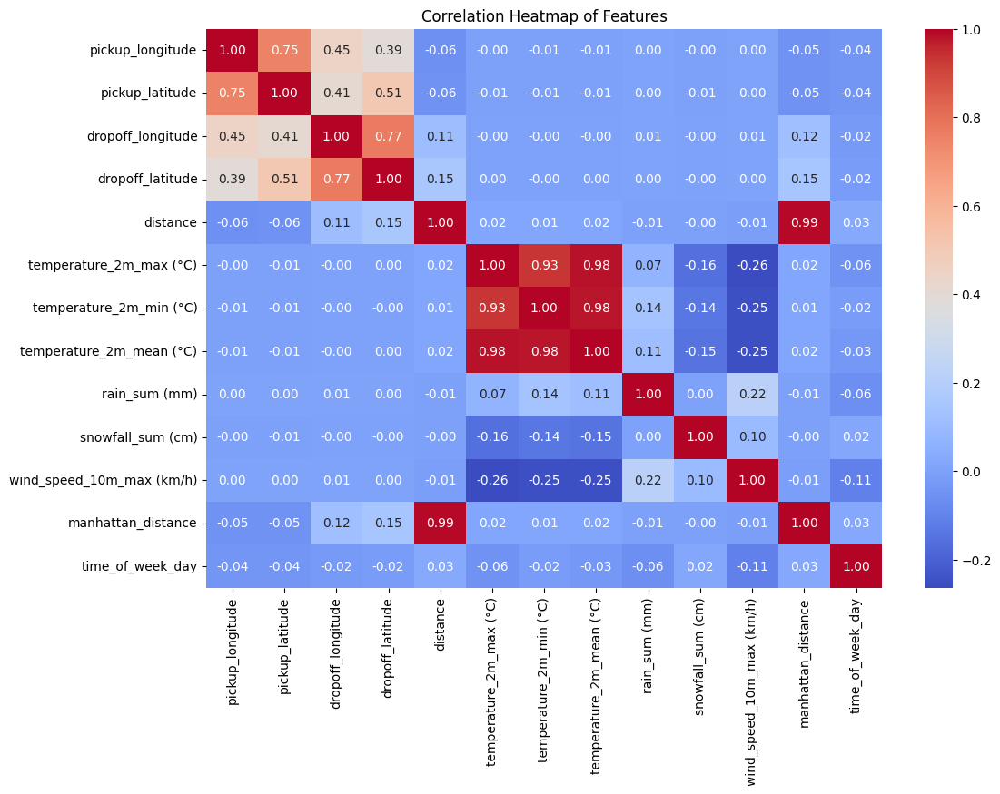

In [45]:
correlation_matrix = data_numerical.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap of Features")
plt.show()

We notice some trends in the data:
-  As expected, the pickup latitude and longitude are related
- As expected, the dropoff latitude and longitude are also pretty correlated
- All the temperature variables are also highly correlated, which would lead us to believe that we want to only choose one of the temperature features to work with, probably the mean as it is the most representative
- When taking a look at trip duration, the only variables that are even mildly correlated are the distance, manhattan distance
- Manhattan distance and distance are almost directly correlated, as we computed the manhattan distance from our original haversine distance, we believe there may be some spatial representation that the normal distance is not taking advantage of
- The temperature is highly correlated with the month, which seems to make sense

### Categorical variable

In [85]:
from pyspark.ml.feature import OneHotEncoder, StringIndexer
from pyspark.ml import Pipeline

pickup_indexer = StringIndexer(inputCol="pickup_neighborhood", outputCol="pickup_neighborhood_index")
dropoff_indexer = StringIndexer(inputCol="dropoff_neighborhood", outputCol="dropoff_neighborhood_index")

pickup_encoder = OneHotEncoder(inputCol="pickup_neighborhood_index", outputCol="pickup_neighborhood_encoded")
dropoff_encoder = OneHotEncoder(inputCol="dropoff_neighborhood_index", outputCol="dropoff_neighborhood_encoded")

pipeline = Pipeline(stages=[pickup_indexer, dropoff_indexer, pickup_encoder, dropoff_encoder])

model = pipeline.fit(data_raw)
data_encoded = model.transform(data_raw)
data_encoded.select("pickup_neighborhood", "pickup_neighborhood_encoded", 
                    "dropoff_neighborhood", "dropoff_neighborhood_encoded").show()

+--------------------+---------------------------+--------------------+----------------------------+
| pickup_neighborhood|pickup_neighborhood_encoded|dropoff_neighborhood|dropoff_neighborhood_encoded|
+--------------------+---------------------------+--------------------+----------------------------+
|Chelsea/Hell's Ki...|             (12,[2],[1.0])|     Upper East Side|              (12,[1],[1.0])|
|             Midtown|             (12,[0],[1.0])|     Upper East Side|              (12,[1],[1.0])|
|Chelsea/Hell's Ki...|             (12,[2],[1.0])|   Greenwich Village|              (12,[5],[1.0])|
|     Upper East Side|             (12,[1],[1.0])|             Midtown|              (12,[0],[1.0])|
|             Midtown|             (12,[0],[1.0])|     Upper West Side|              (12,[4],[1.0])|
|     Upper East Side|             (12,[1],[1.0])|         East Harlem|              (12,[8],[1.0])|
|     Upper East Side|             (12,[1],[1.0])|        Central Park|             (12,[10

In [86]:
data_raw = data_encoded.drop("pickup_neighborhood", "dropoff_neighborhood")

In [87]:
quantiles = data_raw.approxQuantile("trip_duration", [0.005, 0.995], 0.01)
lower_threshold, upper_threshold = quantiles[0], quantiles[1]
data_raw = data_raw.withColumn(
    "store_and_fwd_flag",
    when(col("store_and_fwd_flag") == "Y", 1).otherwise(0) 
) \
	.filter(col('trip_duration') > 0) \
 .filter((col('trip_duration')> lower_threshold) & (col('trip_duration')<= upper_threshold))


In [89]:
data_raw.write.parquet("./data/taxi_modeling_df_spark.parquet")

24/12/28 13:20:21 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , id, vendor_id, pickup_datetime, dropoff_datetime, passenger_count, pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude, store_and_fwd_flag, trip_duration, date, hour, day, month, distance, time, temperature_2m_max (°C), temperature_2m_min (°C), temperature_2m_mean (°C), sunrise (iso8601), sunset (iso8601), rain_sum (mm), snowfall_sum (cm), wind_speed_10m_max (km/h), pickup_neighborhood, dropoff_neighborhood, inter_neighborhood, manhattan_distance, time_of_week_day
 Schema: _c0, id, vendor_id, pickup_datetime, dropoff_datetime, passenger_count, pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude, store_and_fwd_flag, trip_duration, date, hour, day, month, distance, time, temperature_2m_max (°C), temperature_2m_min (°C), temperature_2m_mean (°C), sunrise (iso8601), sunset (iso8601), rain_sum (mm), snowfall_sum (cm), wind_speed_10m_max (km/h), pickup_neighbor

Based on what we observed in the correlation matrix, we choose the below features that we believe would be successful in predicting the outcome trip duration. We remove any highly correlated variables and also insert our own inductive biases about the problem.

### loading model df

In [6]:
path = "./data/taxi_modeling_df.csv"
csv_path = "./data/taxi_modeling_df.csv"

In [7]:
modeling_df = spark.read.csv(path, header=True, inferSchema=True)
modeling_df.printSchema()

root
 |-- _c0: integer (nullable = true)
 |-- Unnamed: 0: integer (nullable = true)
 |-- id: string (nullable = true)
 |-- vendor_id: integer (nullable = true)
 |-- pickup_datetime: timestamp (nullable = true)
 |-- dropoff_datetime: timestamp (nullable = true)
 |-- passenger_count: integer (nullable = true)
 |-- pickup_longitude: double (nullable = true)
 |-- pickup_latitude: double (nullable = true)
 |-- dropoff_longitude: double (nullable = true)
 |-- dropoff_latitude: double (nullable = true)
 |-- store_and_fwd_flag: integer (nullable = true)
 |-- trip_duration: integer (nullable = true)
 |-- date: date (nullable = true)
 |-- hour: integer (nullable = true)
 |-- day: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- distance: double (nullable = true)
 |-- time: date (nullable = true)
 |-- temperature_2m_max (°C): double (nullable = true)
 |-- temperature_2m_min (°C): double (nullable = true)
 |-- temperature_2m_mean (°C): double (nullable = true)
 |-- sunrise (iso

In [8]:
modeling_pd = pd.read_csv(csv_path)
modeling_pd.head()

ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

### Train Test Split

Here we use a train-test split of 80-20 and load our various original and engineered features.

spark

In [10]:
modeling_features = ['passenger_count',
        'hour',
        'day',
        'month',
        'distance',
        'temperature_2m_mean (°C)',
        'rain_sum (mm)',
        'snowfall_sum (cm)',
        'wind_speed_10m_max (km/h)',
        'inter_neighborhood',
        'manhattan_distance',
        'time_of_week_day']


modeling_df_combined = modeling_df.select(*modeling_features, col('trip_duration'))
train_df, test_df = modeling_df_combined.randomSplit([0.8, 0.2], seed=42)

sklearn

In [9]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

modeling_df_pd = modeling_pd[modeling_features]
X_train, X_test, y_train, y_test = train_test_split(modeling_df_pd, modeling_pd['trip_duration'], test_size=0.2, random_state=42)


In [12]:
train_df.describe().show()

+-------+-----------------+-----------------+------------------+------------------+------------------+------------------------+------------------+------------------+-------------------------+------------------+------------------+------------------+-----------------+
|summary|  passenger_count|             hour|               day|             month|          distance|temperature_2m_mean (°C)|     rain_sum (mm)| snowfall_sum (cm)|wind_speed_10m_max (km/h)|inter_neighborhood|manhattan_distance|  time_of_week_day|    trip_duration|
+-------+-----------------+-----------------+------------------+------------------+------------------+------------------------+------------------+------------------+-------------------------+------------------+------------------+------------------+-----------------+
|  count|           976119|           976119|            976119|            976119|            976119|                  976119|            976119|            976119|                   976119|        

In [11]:
X_train.describe()

,passenger_count,hour,day,month,distance,temperature_2m_mean (°C),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h),inter_neighborhood,manhattan_distance,time_of_week_day
count,975801.000000,975801.000000,975801.000000,975801.000000,975801.000000,975801.000000,975801.000000,975801.000000,975801.000000,975801.000000,975801.000000,975801.000000
mean,1.661953,13.740663,3.035832,3.505764,1.460317,8.901599,1.935561,0.171805,18.240390,0.710172,1.893908,3.628954
std,1.314258,6.186975,1.944794,1.680314,1.105209,8.635373,4.470998,1.270499,6.683122,0.453682,1.465685,1.942529
min,1.000000,0.000000,0.000000,1.000000,0.000000,-13.900000,0.000000,0.000000,7.100000,0.000000,0.000000,0.000000
25%,1.000000,9.000000,1.000000,2.000000,0.716644,1.400000,0.000000,0.000000,13.300000,0.000000,0.911830,1.888194
50%,1.000000,14.000000,3.000000,4.000000,1.142823,9.000000,0.000000,0.000000,16.600000,1.000000,1.466933,3.691667
75%,2.000000,19.000000,5.000000,5.000000,1.849431,14.900000,1.800000,0.000000,22.300000,1.000000,2.389723,5.366667
max,6.000000,23.000000,6.000000,6.000000,12.356478,25.400000,31.200000,30.800000,41.300000,1.000000,16.324996,6.999306


In [9]:
print(f"Train shape of Spark split: ({train_df.count()},{len(train_df.columns)})")
print(f"Test shape of Spark Split: ({test_df.count()},{len(test_df.columns)})")
print(f"Train shape of Pandas split: {X_train.shape}")
print(f"Test shape of Pandas split: {X_test.shape}")

NameError: name 'train_df' is not defined

Since many of our variables are also skewed distribution, we decide to make the decision to test and use robust scaler as compared to the standard scaler.

### scaling in sklearn

In [41]:
scaler_n = StandardScaler()
X_train_scaled = scaler_n.fit_transform(X_train[modeling_features])
X_train_scaled = pd.DataFrame(X_train_scaled, columns=modeling_features, index=X_train.index)

X_test_scaled = scaler_n.transform(X_test[modeling_features])
X_test_scaled = pd.DataFrame(X_test_scaled, columns=modeling_features, index=X_test.index)

# Concatenate the scaled modeling features with binary outcome features
X_train_scaled = pd.concat([X_train_scaled], axis=1).reset_index(drop=True)
X_test_scaled = pd.concat([X_test_scaled], axis=1).reset_index(drop=True)


X_train_scaled.head()

,passenger_count,hour,day,month,distance,temperature_2m_mean (°C),rain_sum (mm),snowfall_sum (cm),wind_speed_10m_max (km/h),inter_neighborhood,manhattan_distance,time_of_week_day
0,-0.503670,-0.119713,-1.561005,1.484388,-0.626437,1.099942,-0.432915,-0.135226,0.757073,-1.565352,-0.576473,-1.584666
1,-0.503670,0.365176,1.009962,0.889260,0.365783,0.231420,-0.030320,-0.135226,-0.694345,0.638834,0.506098,1.049358
2,0.257216,1.011696,1.524156,0.294133,-0.017869,-0.625520,0.551206,0.030063,3.450427,0.638834,-0.123416,1.660675
3,-0.503670,0.203547,-0.018425,-0.300994,-0.226986,-1.111892,-0.432915,-0.135226,-0.290342,0.638834,-0.166576,0.016912
4,-0.503670,-0.927863,-1.046812,-1.491248,0.040979,-1.123473,-0.432915,-0.135226,1.191002,0.638834,-0.223470,-1.181769


### scaling in spark

In [13]:
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.sql import functions as F

assembler = VectorAssembler(inputCols=modeling_features, outputCol="features")
train_df_vector = assembler.transform(train_df)
test_df_vector = assembler.transform(test_df)

scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withMean=True)
scaler_model = scaler.fit(train_df_vector)  # Fit on the training data
train_df_scaled = scaler_model.transform(train_df_vector)
test_df_scaled = scaler_model.transform(test_df_vector)

In [14]:
from pyspark.ml.functions import vector_to_array

train_df_scaled_show = train_df_scaled.withColumn("scaled_features_array", vector_to_array("scaled_features"))
# Split the scaled array into separate columns
for i, col_name in enumerate(modeling_features):
    train_df_scaled_show = train_df_scaled_show.withColumn(col_name, F.col("scaled_features_array")[i])
train_df_scaled_show = train_df_scaled_show.drop("features", "scaled_features", "scaled_features_array")
train_df_scaled_show.show()

+-------------------+-------------------+-------------------+--------------------+--------------------+------------------------+------------------+--------------------+-------------------------+------------------+--------------------+-------------------+-------------+
|    passenger_count|               hour|                day|               month|            distance|temperature_2m_mean (°C)|     rain_sum (mm)|   snowfall_sum (cm)|wind_speed_10m_max (km/h)|inter_neighborhood|  manhattan_distance|   time_of_week_day|trip_duration|
+-------------------+-------------------+-------------------+--------------------+--------------------+------------------------+------------------+--------------------+-------------------------+------------------+--------------------+-------------------+-------------+
|-0.5040413634864392|-2.2202140075020855|-1.5610958686406968|-0.30029265797979215| -0.9825262635342016|    -0.28934475585370745|0.5947672977372986|-0.13517311054942888|       1.1620814825772572

In [15]:
train_df_scaled_show.describe().show()

+-------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------------+--------------------+--------------------+-------------------------+--------------------+--------------------+--------------------+-----------------+
|summary|     passenger_count|                hour|                 day|               month|            distance|temperature_2m_mean (°C)|       rain_sum (mm)|   snowfall_sum (cm)|wind_speed_10m_max (km/h)|  inter_neighborhood|  manhattan_distance|    time_of_week_day|    trip_duration|
+-------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------------+--------------------+--------------------+-------------------------+--------------------+--------------------+--------------------+-----------------+
|  count|              976119|              976119|              976119|              976119|              976119|                  9

In [16]:
X_train_scaled.describe()

NameError: name 'X_train_scaled' is not defined

prep the df for modeling

In [16]:
train_df_model = train_df_scaled.select("trip_duration", "scaled_features") 
test_df_model = test_df_scaled.select("trip_duration", "scaled_features")
train_df_model.show()

+-------------+--------------------+
|trip_duration|     scaled_features|
+-------------+--------------------+
|          215|[-0.5040413634864...|
|          154|[-0.5040413634864...|
|          637|[-0.5040413634864...|
|          222|[-0.5040413634864...|
|          122|[-0.5040413634864...|
|          525|[-0.5040413634864...|
|          270|[-0.5040413634864...|
|          394|[-0.5040413634864...|
|          325|[-0.5040413634864...|
|          226|[-0.5040413634864...|
|          307|[-0.5040413634864...|
|          188|[-0.5040413634864...|
|          430|[-0.5040413634864...|
|          470|[-0.5040413634864...|
|          491|[-0.5040413634864...|
|          305|[-0.5040413634864...|
|          271|[-0.5040413634864...|
|          448|[-0.5040413634864...|
|          286|[-0.5040413634864...|
|          446|[-0.5040413634864...|
+-------------+--------------------+
only showing top 20 rows



# Part 6: Modeling

At this point, we've analyzed some significant feaatures that could go into our model, as well as test some outlying conditions that exist in the dataset. The way we decide to pick our models is the following:

1. Given that our results could be presented to taxi companies or individual users, these stakeholders would want to know exactly what is going into the predictions of a time-sensitive variable such as trip duration.
1. We want to pick models that are high capacity, since we have a lot of data to sift through, and not necessarily a general distribution that we see trending in the trip duration.
1. Our baseline model needs to be able to explain some variance in the data.

At the end, we decided to choose linear regression for the baseline model. We also use two ensemble models: Random Forest and XGBoost to test different capacities of ensembles (boosting vs bagging).

For all these models, they are quite interpretable because we can view their feature importances, unlike a deep neural network (which we would use if we wanted to maximize predictive power).

## Baseline: Linear Regression
We believe a suitable baseline model for predicting trip duration would be linear regression. We exclude features such as pickup and dropoff neighborhood and vendor_id because a one-hot encoding of all of these would require an excessive number of columns. An ordinal encoding would also not make sense because these columns have no meaningful order.

### sklearn

In [17]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import pandas as pd
from xgboost import XGBRegressor

lr_sk = LinearRegression()
lr_sk.fit(X_train_scaled, y_train)
y_pred = lr_sk.predict(X_test_scaled)

NameError: name 'X_train_scaled' is not defined

In [47]:
rmse = root_mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Root Mean Squared Error: {rmse}")
print(f"R^2 Score: {r2}")

Root Mean Squared Error: 311.90753512704634
R^2 Score: 0.4547608818145811


### spark

In [18]:
from pyspark.ml.regression import LinearRegression, RandomForestRegressor
from pyspark.ml.evaluation import RegressionEvaluator

lr_spk = LinearRegression(featuresCol='scaled_features', labelCol='trip_duration', predictionCol='prediction')
lr_model = lr_spk.fit(train_df_model)
y_pred = lr_model.transform(test_df_model)

24/12/28 19:29:18 WARN Instrumentation: [a949931b] regParam is zero, which might cause numerical instability and overfitting.
24/12/28 19:29:23 WARN InstanceBuilder: Failed to load implementation from:dev.ludovic.netlib.blas.JNIBLAS
24/12/28 19:29:23 WARN InstanceBuilder: Failed to load implementation from:dev.ludovic.netlib.blas.VectorBLAS
24/12/28 19:29:25 WARN InstanceBuilder: Failed to load implementation from:dev.ludovic.netlib.lapack.JNILAPACK


In [19]:
from pyspark.ml.evaluation import RegressionEvaluator
metrics = ['rmse', 'r2']
evaluator = RegressionEvaluator(labelCol="trip_duration", predictionCol="prediction")
r2 = evaluator.evaluate(y_pred, {evaluator.metricName: "r2"})
rmse = evaluator.evaluate(y_pred, {evaluator.metricName: "rmse"})

print(f"Root Mean Squared Error: {rmse}")
print(f"R^2 Score: {r2}")

Root Mean Squared Error: 311.8221174421014
R^2 Score: 0.45830623336484044


confirmed that they have the same result 

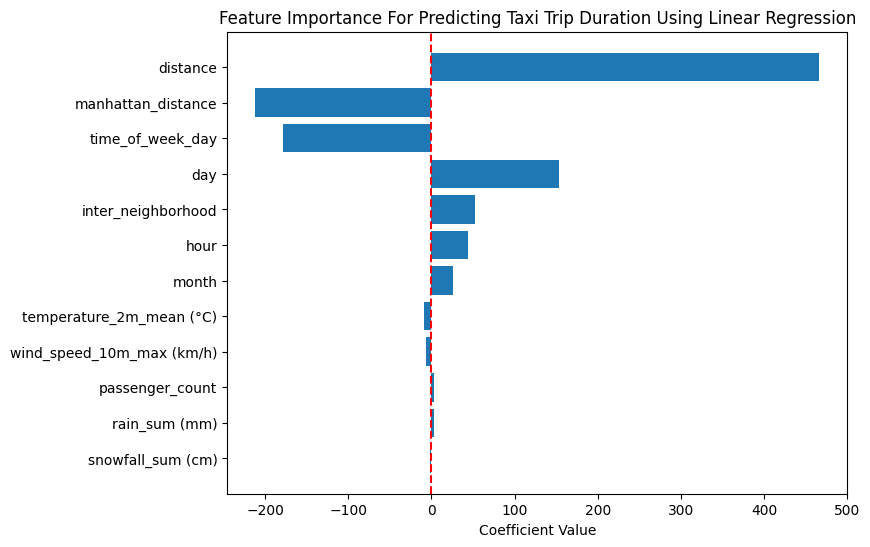

In [20]:
coefficients = np.array(lr_model.coefficients.toArray())

sorted_indices = np.argsort(np.abs(coefficients))
sorted_features = np.array(modeling_features)[sorted_indices]
sorted_coefficients = np.array(coefficients)[sorted_indices]

plt.figure(figsize=(8, 6))
plt.barh(sorted_features, sorted_coefficients)
plt.axvline(0, color='red', linestyle='--')
plt.xlabel('Coefficient Value')
plt.title('Feature Importance For Predicting Taxi Trip Duration Using Linear Regression')
plt.show()

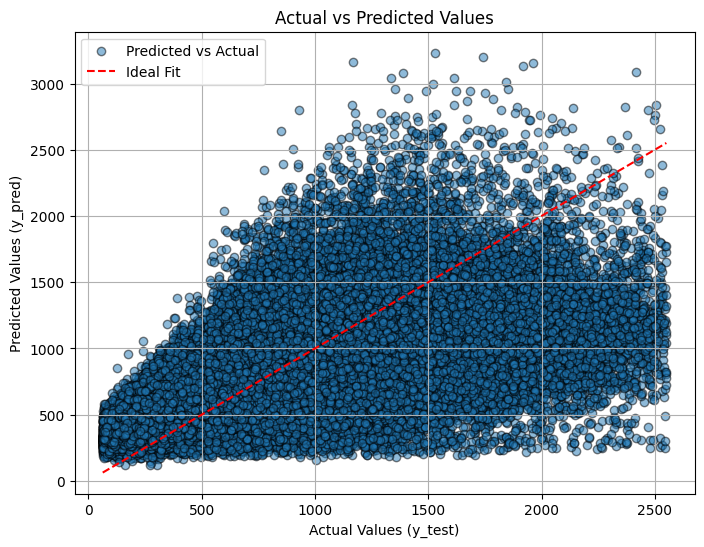

In [22]:
predictions_pd = y_pred.select('trip_duration', 'prediction').toPandas()
y_test_ = predictions_pd['trip_duration']
y_pred_ = predictions_pd['prediction']
plt.figure(figsize=(8, 6))
plt.scatter(y_test_, y_pred_, alpha=0.5, edgecolor='k', label='Predicted vs Actual')

plt.plot([y_test_.min(), y_test_.max()], [y_test_.min(), y_test_.max()], color='red', linestyle='--', label='Ideal Fit')

plt.xlabel('Actual Values (y_test)')
plt.ylabel('Predicted Values (y_pred)')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.grid(True)
plt.show()

$R^2$ increased slightly, because we added more variables. However, the model is most likely being overtaken by the extra features and their scale.

Based on these results, we can conclude that the model explains less than 50% of the variance in trip duration based on the independent variables chosen.

Clearly it seems that distance and inter_neighborhood have the most predictive power, and this makes sense intuitively because longer distance trips generally take longer. Month, day, and hour show weaker correlations. The correlation for month could be due to seasonal traffic at different times of year, such as due to schools. The correlation for day of the week could be from varying traffic patterns and the correlation of hour could be related to increased traffic later in the day.

The baseline model is unable to make slightly better than random predictions. These insights about features suggest that a more sophisticated model that allows for arbitrary splits rather than a linear trend would be highly beneficial.



Furthermore the actual versus predicted graph shows that essentially our predictions are arbitrary. The regression line that runs through the middle is an ideal regression line fit on the values of y_test, and there is a wide band. We observe a lot of underfitting.

When we add the extra predictors related to the model, there is increased $R^2$ and lower MSE. Therefore, for the further models, we will include the neighborhoods, as the other models we have are decision tree-based models, which should be relatively scale invariant and can process greater dimensions better.

## Random Forest Regression

### Initial testing

### sklearn

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
%time
import sklearn.ensemble as ensemble
model_rf = ensemble.RandomForestRegressor(random_state = 42)
model_rf.fit(X_train_scaled, y_train)
y_pred_rf = np.maximum(model_rf.predict(X_test_scaled), 0)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
print(f"R^2 Score: {r2_rf}")
print("Root Mean Squared Error (RMSE):", root_mean_squared_error(y_test, y_pred_rf))

CPU times: user 2 μs, sys: 4 μs, total: 6 μs
Wall time: 13.1 μs


ValueError: Found input variables with inconsistent numbers of samples: [243633, 243951]

### now with spark

In [23]:
%time
rf_spk = RandomForestRegressor(featuresCol='scaled_features', labelCol='trip_duration', predictionCol='prediction')
rf_model = rf_spk.fit(train_df_model)
y_pred_rf_spk = rf_model.transform(test_df_model)

CPU times: user 2 μs, sys: 1 μs, total: 3 μs
Wall time: 8.82 μs


In [24]:
r2 = evaluator.evaluate(y_pred_rf_spk, {evaluator.metricName: "r2"})
rmse = evaluator.evaluate(y_pred_rf_spk, {evaluator.metricName: "rmse"})

print(f"Root Mean Squared Error: {rmse}")
print(f"R^2 Score: {r2}")

Root Mean Squared Error: 287.8590380014794
R^2 Score: 0.5383639196606562


We noticed that the random forest model took really long to run; thus we decided to parallelize the computations for the hyperparameter tuning

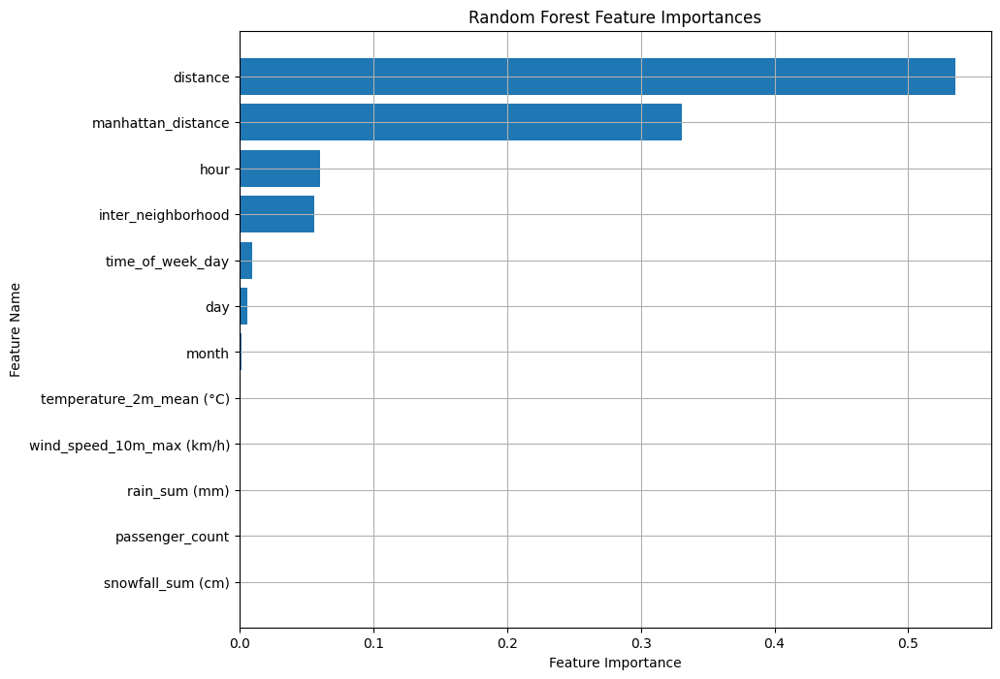

In [25]:
feature_importances = rf_model.featureImportances.toArray()
feature_names = modeling_features
sorted_indices = np.argsort(feature_importances)
sorted_importances = feature_importances[sorted_indices]
sorted_features = np.array(feature_names)[sorted_indices]

plt.figure(figsize=(10,8))
plt.barh(sorted_features, sorted_importances)
plt.grid()
plt.xlabel("Feature Importance")
plt.ylabel("Feature Name")
plt.title("Random Forest Feature Importances")
plt.show()

### Random Forest Hyperparameter Tuning

We choose to use Random Search CV for both XGBoost regression and random forest regression because we want to minimize the computation time while also maximizing the performance benefits we get from using a hyper parameter tuning method.

The hyperparameters that we choose for the random forest bagging model:
1. `n_estimators` will determine whether or not more estimators will be able to get better averages and will be able to learn different errors across different estimators
1. `max_depth` determines the complexity of each decision tree model
1. `min_samples_split` will determine how many samples we need to split decision on the model, and in this case will determine if we are more or less sensitive to changes in certain variables. Smaller min samples split will give us a more complex tree, as more splits will be required
1. `min_samples_leaf` determines the number of samples required to be at a leaf node. Smaller values allow the model to create more granular splits, while larger values prevent overfitting by ensuring each leaf represents a significant portion of the data.
1. `max_features` specifies the number of features to consider when looking for the best split at each node. This setting can help us prevent overfitting by looking through the same feature sets. However, given the size of our data, this should not be a problem


In [26]:
import random
class RandomGridBuilder: 
  '''Grid builder for random search. Sets up grids for use in CrossValidator in Spark using values randomly sampled from user-provided distributions.
  Distributions should be provided as lambda functions, so that the numbers are generated at call time.
  
  Parameters:
    num_models: Integer (Python) - number of models to generate hyperparameters for
    seed: Integer (Python) - seed (optional, default is None)
    
  Returns:
    param_map: list of parameter maps to use in cross validation.
    
  Example usage:
    from pyspark.ml.classification import LogisticRegression
    lr = LogisticRegression()
    paramGrid = RandomGridBuilder(2)\
               .addDistr(lr.regParam, lambda: np.random.rand()) \
               .addDistr(lr.maxIter, lambda : np.random.randint(10))\
               .build()
               
    Returns similar output as Spark ML class ParamGridBuilder and can be used in its place. The above paramGrid provides random hyperparameters for 2 models.
    '''
  
  def __init__(self, num_models, seed=None):
    self._param_grid = {}
    self.num_models = num_models
    self.seed = seed
    
  def addDistr(self, param, distr_generator):
    '''Add distribution based on dictionary generated by function passed to addDistr.'''
    
    if 'pyspark.ml.param.Param' in str(type(param)):
      self._param_grid[param] = distr_generator
    else:
      raise TypeError('param must be an instance of Param')

    return self
  
  def build(self):    
    param_map = []
    for n in range(self.num_models):
      if self.seed:
        # Set seeds for both numpy and random in case either is used for the random distribution
        np.random.seed(self.seed + n)
        random.seed(self.seed + n)
      param_dict = {}
      for param, distr in self._param_grid.items():
        param_dict[param] = distr()
      param_map.append(param_dict)
    
    return param_map


In [27]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
import numpy as np

rf = RandomForestRegressor(featuresCol='scaled_features', labelCol='trip_duration', predictionCol='prediction')

paramGrid = RandomGridBuilder(20) \
    .addDistr(rf.numTrees, lambda : np.random.randint(10, 100)) \
    .addDistr(rf.maxDepth, lambda : np.random.randint(2, 10)) \
    .build()

In [28]:
%time 
evaluator = RegressionEvaluator(labelCol="trip_duration", predictionCol="prediction", metricName="rmse")
crossval = CrossValidator(estimator=rf,
						  estimatorParamMaps=paramGrid,
						  evaluator=evaluator,
						  numFolds=3)
cv_model = crossval.fit(train_df_scaled)
best_model = cv_model.bestModel


CPU times: user 2 μs, sys: 1e+03 ns, total: 3 μs
Wall time: 12.2 μs


24/12/28 19:32:47 WARN DAGScheduler: Broadcasting large task binary with size 1749.2 KiB
24/12/28 19:34:05 WARN DAGScheduler: Broadcasting large task binary with size 1418.4 KiB
24/12/28 19:34:11 WARN DAGScheduler: Broadcasting large task binary with size 2.6 MiB
24/12/28 19:35:15 WARN DAGScheduler: Broadcasting large task binary with size 1351.4 KiB
24/12/28 19:36:40 WARN DAGScheduler: Broadcasting large task binary with size 1598.0 KiB
24/12/28 19:38:03 WARN DAGScheduler: Broadcasting large task binary with size 1016.2 KiB
24/12/28 19:38:16 WARN DAGScheduler: Broadcasting large task binary with size 1919.7 KiB
24/12/28 19:40:42 WARN DAGScheduler: Broadcasting large task binary with size 1180.2 KiB
24/12/28 19:40:49 WARN DAGScheduler: Broadcasting large task binary with size 2.2 MiB
24/12/28 19:40:58 WARN DAGScheduler: Broadcasting large task binary with size 4.3 MiB
24/12/28 19:41:07 WARN DAGScheduler: Broadcasting large task binary with size 1347.0 KiB
24/12/28 19:41:59 WARN DAGSche

In [29]:
print(f"Best numTrees: {best_model.getNumTrees}")
print(f"Best maxDepth: {best_model.getMaxDepth()}")

Best numTrees: 55
Best maxDepth: 9


In [30]:
y_pred_best_rf = best_model.transform(test_df_model)

# Evaluate the model
rmse_best_rf = evaluator.evaluate(y_pred_best_rf, {evaluator.metricName: "rmse"})
r2_best_rf = evaluator.evaluate(y_pred_best_rf, {evaluator.metricName: "r2"})

print("Root Mean Squared Log Error (RMSLE):",rmse_best_rf)
print(f"test r2 score for best rf model: {r2_best_rf}")

Root Mean Squared Log Error (RMSLE): 271.7406035948748
test r2 score for best rf model: 0.588614408318855


## XGBoost Regression

### sklearn

In [ ]:
model_xgb = XGBRegressor(objective='reg:squarederror', random_state=42, n_jobs=-1)
model_xgb.fit(X_train_scaled, y_train)
y_pred_xgb = np.maximum(model_xgb.predict(X_train_scaled), 0)
y_train_pred_xgb = np.maximum(model_xgb.predict(X_train_scaled), 0)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)
r2_xgb_train = r2_score(y_train, y_train_pred_xgb)

print("Hyper parameters: ", model_xgb.get_xgb_params())
print("Mean Squared Error (MSE):", mse_xgb)
print("Train R^2 Score:", r2_xgb_train)
print("R^2 Score:", r2_xgb)
print("Root Mean Squared Log Error (RMSLE):", root_mean_squared_log_error(y_test, y_pred_xgb))

Hyper parameters:  {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'eval_metric': None, 'gamma': None, 'grow_policy': None, 'interaction_constraints': None, 'learning_rate': None, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': None, 'max_leaves': None, 'min_child_weight': None, 'monotone_constraints': None, 'multi_strategy': None, 'n_jobs': -1, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}
Mean Squared Error (MSE): 54948.08785462107
Train R^2 Score: 0.6995611190795898
R^2 Score: 0.6920445561408997
Root Mean Squared Log Error (RMSLE): 0.3628359740731843


### spark

In [33]:
from xgboost.spark import SparkXGBRegressor

xgb_spk = SparkXGBRegressor(features_col='scaled_features', label_col='trip_duration', prediction_col='prediction', num_workers=2)
xgb_model = xgb_spk.fit(train_df_model)
y_pred_xgb_spk = xgb_model.transform(test_df_model)

INFO:XGBoost-PySpark:Running xgboost-2.1.3 on 1 workers with
	booster params: {'objective': 'reg:squarederror', 'device': 'cpu', 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 100}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2024-12-28 20:14:30,313 INFO XGBoost-PySpark: _train_booster Training on CPUs 1]
[20:14:31] Task 0 got rank 0
INFO:XGBoost-PySpark:Finished xgboost training!                                 
/Users/alanwu/Documents/GitHub/NYC-Taxi-Duration-Prediction/venv/lib/python3.11/site-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBRegressor or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will rai

AttributeError: 'super' object has no attribute '__sklearn_tags__'

In [ ]:
r2 = evaluator.evaluate(y_pred_xgb_spk, {evaluator.metricName: "r2"})
rmse = evaluator.evaluate(y_pred_xgb_spk, {evaluator.metricName: "rmse"})

print(f"Root Mean Squared Error: {rmse}")
print(f"R^2 Score: {r2}")

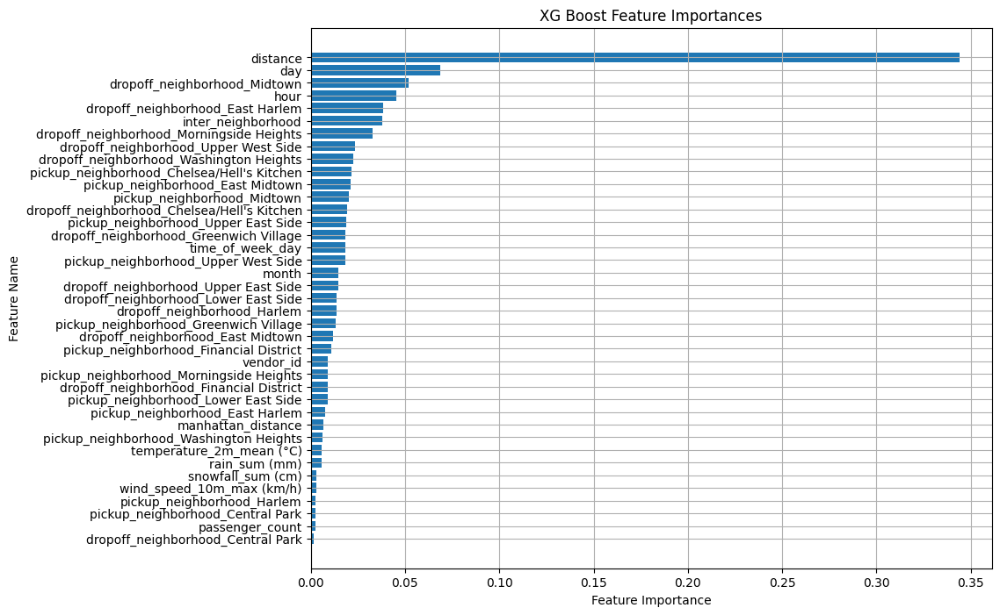

In [ ]:
feature_importances = model_xgb.feature_importances_
feature_names = X_train_scaled_n.columns
sorted_indices = np.argsort(feature_importances)
sorted_importances = feature_importances[sorted_indices]
sorted_features = np.array(feature_names)[sorted_indices]

plt.figure(figsize=(10,8))
plt.barh(sorted_features, sorted_importances)
plt.grid()
plt.xlabel("Feature Importance")
plt.ylabel("Feature Name")
plt.title("XG Boost Feature Importances")
plt.show()

#### XGBoost Hyperparamter Tuning

We decided to use RandomizedSearchCV to tune the hyperparameters of our XGBoost model, as it will give us a good estimate of what is in the range of all the possibilities of models we can use. Given the size of our dataset, RandomizedSearchCV is also less computationally expensive than GridSearchCV, which exhausts all possible hyperparameter combinations.

The hyperparameters we decided to tune could all be highly relevant to the performance of the model:
1. Testing many number of estimators gives us a good estimate of whether or not increasing capacity of gradient boosting model will fit the complexity of the data
1. testing the max depth of the tree will tell us if less levels will perform better, indicating that we may have a simpler decision pattern, or we don't need to go as deep in the decisions we make.
1. Adjusting the learning rate will determine how quick and if we converge to an optimal loss
1. Adjusting the subsample ratio will help us understand whether training on a fraction of the data at each iteration improves generalization and prevents overfitting. Subsampling can also speed up training by reducing the data size used in each boosting round.
1. Tuning the colsample_bytree parameter allows us to explore the impact of using a subset of features for each tree. This can reduce overfitting and make the model more robust, especially in datasets with many irrelevant or redundant features.
1.	Testing different gamma values will control the minimum loss reduction required to split a node. Higher values make the algorithm more conservative by preventing splits unless they bring significant gain, which can reduce overfitting but might increase underfitting.
1. Regularization terms (reg_alpha and reg_lambda) are important to control the complexity of the model.
	- reg_alpha adds L1 regularization, which encourages sparsity in feature weights and can be beneficial for feature selection.
	- reg_lambda adds L2 regularization, which penalizes large weights to prevent overfitting and stabilize the model.


We added a variety of different values to our hyperparameter distribution to try to capture the full range of all possible hyperparameters.

In [ ]:
model_xgb = XGBRegressor(random_state=42)
param_dist = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.02, 0.05],
    'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3, 0.4, 0.5],
    'reg_alpha': [0, 0.01, 0.1, 1, 10],
    'reg_lambda': [0.1, 1, 10, 100]
}

random_search_xgb = RandomizedSearchCV(
    estimator=model_xgb,
    param_distributions=param_dist,
    n_iter=50,
    scoring='neg_mean_squared_error',
    cv=3,
    random_state=42,
    verbose=10
)

random_search_xgb.fit(X_train_scaled_n, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV 1/3; 1/50] START colsample_bytree=0.8, gamma=0.3, learning_rate=0.001, max_depth=7, n_estimators=50, reg_alpha=0.01, reg_lambda=10, subsample=0.7
[CV 1/3; 1/50] END colsample_bytree=0.8, gamma=0.3, learning_rate=0.001, max_depth=7, n_estimators=50, reg_alpha=0.01, reg_lambda=10, subsample=0.7;, score=-169899.032 total time=   0.8s
[CV 2/3; 1/50] START colsample_bytree=0.8, gamma=0.3, learning_rate=0.001, max_depth=7, n_estimators=50, reg_alpha=0.01, reg_lambda=10, subsample=0.7
[CV 2/3; 1/50] END colsample_bytree=0.8, gamma=0.3, learning_rate=0.001, max_depth=7, n_estimators=50, reg_alpha=0.01, reg_lambda=10, subsample=0.7;, score=-168566.970 total time=   0.9s
[CV 3/3; 1/50] START colsample_bytree=0.8, gamma=0.3, learning_rate=0.001, max_depth=7, n_estimators=50, reg_alpha=0.01, reg_lambda=10, subsample=0.7
[CV 3/3; 1/50] END colsample_bytree=0.8, gamma=0.3, learning_rate=0.001, max_depth=7, n_estimators=50, reg_alpha=0

RandomizedSearchCV(cv=3,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                   n_iter=50,
                   param_distributions={'colsample_bytree': [0.5, 0.6, 0.7, 0.8,
                                                             0.9, 1.0],
                                        'gamma': [0, 0.1, 0.2, 0.3, 0.4, 0.5],
                                        'learning_rate': [0.001, 0.01, 0.02,
                                                          0.05],
                                        'max_depth': [3, 5, 7],
                                        'n_estimators': [50, 100, 200, 300],
                                        'reg_alpha': [0, 0.01, 0.1, 1, 10],
                                        'reg_lambda': [0.1, 1, 10, 100],
                                        'subsample': [0.5, 0.6, 0.7, 0.8, 0.9,
                                                      1.0]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=10)

In [ ]:
print("Best Parameters:", random_search_xgb.best_params_)
print("Best Cross-Validation Score:", -random_search_xgb.best_score_)
best_xgb = random_search_xgb.best_estimator_
y_pred_best_xgb = best_xgb.predict(X_test_scaled_n)

# Evaluate the model
mse_best_xgb = mean_squared_error(y_test, y_pred_best_xgb)
r2_best_xgb = r2_score(y_test, y_pred_best_xgb)

print(f"MSE score for best xgb model: {mse_best_xgb}")
print(f"test r2 score for best xgb model: {r2_best_xgb}")
print("Root Mean Squared Log Error (RMSLE):", root_mean_squared_log_error(y_test, y_pred_best_xgb))

Best Parameters: {'subsample': 0.7, 'reg_lambda': 100, 'reg_alpha': 1, 'n_estimators': 300, 'max_depth': 7, 'learning_rate': 0.05, 'gamma': 0.5, 'colsample_bytree': 0.6}
Best Cross-Validation Score: 56145.05233148501
MSE score for best xgb model: 56019.931304151534
test r2 score for best xgb model: 0.6860374212265015
Root Mean Squared Log Error (RMSLE): 0.3645022086196742


# Part 7: Conclusion



**Overall takeaways**:
- Given the complexity of predicting trip duration, the size of the dataset (over 1 million rows) made training the models (particularly Random Forest and XGBoost) computationally expensive, especially in terms of runtime.
- The combination of distance and time of day explained most of the variance of trip duration, but more features such as the speed of the taxi or traffic data throughout the journey would have been highly beneficial.
- The Random Forest regressor and XGBoost regressor had the same RMSLE of 0.362 and roughly the same MSE of 54,900, but the Random Forest had slightly greater R2 of 0.699 compared to XGBoost’s R2 of 0.686.

**Business Implications**:
- Using the random forest model, for business stakeholders, we can visualize decision tree splits. This way, they can tell which way our model is going in terms of decision making.
- In addition to visualization, we could adjust the prediction of our model to account for real conditions and the distribution of the taxi durations. Instead of taking the average of all the regressor predictions as the value, we could potentially take a weighted sum or average to give taxi companies a better sense.

**Modeling implications**:
- We observed that distance and time of day were the most significant predictors of trip duration.
- We noticed that the feature importance of weather (particularly temperature) was very different in the Random Forest and XGBoost models. In particular, temperature was a top 5 feature in the Random Forest but had very low importance in XGBoost.
- The trip duration was quite skewed due to our focus on Manhattan, which made predicting trip duration more challenging.

**Future work**:
- Experimenting with traffic data and data regarding the most commonly used routes through Manhattan.
- Understanding how trip durations have changed year-to-year especially before and after the pandemic.
- Seeing how the feature importance was different for the Random Forest and XGBoost models, we could create an ensemble model combining multiple different models. For example, we could combine the Random Forest and XGBoost regressors that we developed here, and possibly a Neural Network as well, to further reduce the error.
